In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn  import svm
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from imblearn.over_sampling import SMOTE
from collections import Counter
from sklearn.decomposition import PCA
from yellowbrick.classifier import ConfusionMatrix


In [ ]:
from google.colab import drive

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df=pd.read_csv("/content/drive/MyDrive/star_classification.csv")
df.head()

,obj_ID,alpha,delta,u,g,r,i,z,run_ID,rerun_ID,cam_col,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID
0,1.237661e+18,135.689107,32.494632,23.87882,22.27530,20.39501,19.16573,18.79371,3606,301,2,79,6.543777e+18,GALAXY,0.634794,5812,56354,171
1,1.237665e+18,144.826101,31.274185,24.77759,22.83188,22.58444,21.16812,21.61427,4518,301,5,119,1.176014e+19,GALAXY,0.779136,10445,58158,427
2,1.237661e+18,142.188790,35.582444,25.26307,22.66389,20.60976,19.34857,18.94827,3606,301,2,120,5.152200e+18,GALAXY,0.644195,4576,55592,299
3,1.237663e+18,338.741038,-0.402828,22.13682,23.77656,21.61162,20.50454,19.25010,4192,301,3,214,1.030107e+19,GALAXY,0.932346,9149,58039,775
4,1.237680e+18,345.282593,21.183866,19.43718,17.58028,16.49747,15.97711,15.54461,8102,301,3,137,6.891865e+18,GALAXY,0.116123,6121,56187,842


In [ ]:
df.describe()

,obj_ID,alpha,delta,u,g,r,i,z,run_ID,rerun_ID,cam_col,field_ID,spec_obj_ID,redshift,plate,MJD,fiber_ID
count,1.000000e+05,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.0,100000.000000,100000.000000,1.000000e+05,100000.000000,100000.000000,100000.000000,100000.000000
mean,1.237665e+18,177.629117,24.135305,21.980468,20.531387,19.645762,19.084854,18.668810,4481.366060,301.0,3.511610,186.130520,5.783882e+18,0.576661,5137.009660,55588.647500,449.312740
std,8.438560e+12,96.502241,19.644665,31.769291,31.750292,1.854760,1.757895,31.728152,1964.764593,0.0,1.586912,149.011073,3.324016e+18,0.730707,2952.303351,1808.484233,272.498404
min,1.237646e+18,0.005528,-18.785328,-9999.000000,-9999.000000,9.822070,9.469903,-9999.000000,109.000000,301.0,1.000000,11.000000,2.995191e+17,-0.009971,266.000000,51608.000000,1.000000
25%,1.237659e+18,127.518222,5.146771,20.352353,18.965230,18.135828,17.732285,17.460677,3187.000000,301.0,2.000000,82.000000,2.844138e+18,0.054517,2526.000000,54234.000000,221.000000
50%,1.237663e+18,180.900700,23.645922,22.179135,21.099835,20.125290,19.405145,19.004595,4188.000000,301.0,4.000000,146.000000,5.614883e+18,0.424173,4987.000000,55868.500000,433.000000
75%,1.237668e+18,233.895005,39.901550,23.687440,22.123767,21.044785,20.396495,19.921120,5326.000000,301.0,5.000000,241.000000,8.332144e+18,0.704154,7400.250000,56777.000000,645.000000
max,1.237681e+18,359.999810,83.000519,32.781390,31.602240,29.571860,32.141470,29.383740,8162.000000,301.0,6.000000,989.000000,1.412694e+19,7.011245,12547.000000,58932.000000,1000.000000


In [ ]:
df.index

RangeIndex(start=0, stop=100000, step=1)

In [ ]:
df.shape

(100000, 18)

In [ ]:
df.size

1800000

In [ ]:
df.ndim

2

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 18 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   obj_ID       100000 non-null  float64
 1   alpha        100000 non-null  float64
 2   delta        100000 non-null  float64
 3   u            100000 non-null  float64
 4   g            100000 non-null  float64
 5   r            100000 non-null  float64
 6   i            100000 non-null  float64
 7   z            100000 non-null  float64
 8   run_ID       100000 non-null  int64  
 9   rerun_ID     100000 non-null  int64  
 10  cam_col      100000 non-null  int64  
 11  field_ID     100000 non-null  int64  
 12  spec_obj_ID  100000 non-null  float64
 13  class        100000 non-null  object 
 14  redshift     100000 non-null  float64
 15  plate        100000 non-null  int64  
 16  MJD          100000 non-null  int64  
 17  fiber_ID     100000 non-null  int64  
dtypes: float64(10), int64(7),

In [ ]:
df.dtypes

obj_ID         float64
alpha          float64
delta          float64
u              float64
g              float64
r              float64
i              float64
z              float64
run_ID           int64
rerun_ID         int64
cam_col          int64
field_ID         int64
spec_obj_ID    float64
class           object
redshift       float64
plate            int64
MJD              int64
fiber_ID         int64
dtype: object

In [ ]:
df.columns

Index(['obj_ID', 'alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID',
       'rerun_ID', 'cam_col', 'field_ID', 'spec_obj_ID', 'class', 'redshift',
       'plate', 'MJD', 'fiber_ID'],
      dtype='object')

In [ ]:
df['MJD']

0        56354
1        58158
2        55592
3        58039
4        56187
         ...  
99995    57749
99996    56934
99997    54535
99998    56368
99999    57104
Name: MJD, Length: 100000, dtype: int64

In [ ]:
df['alpha']

0        135.689107
1        144.826101
2        142.188790
3        338.741038
4        345.282593
            ...    
99995     39.620709
99996     29.493819
99997    224.587407
99998    212.268621
99999    196.896053
Name: alpha, Length: 100000, dtype: float64

In [ ]:
df.nunique()

obj_ID          78053
alpha           99999
delta           99999
u               93748
g               92651
r               91901
i               92019
z               92007
run_ID            430
rerun_ID            1
cam_col             6
field_ID          856
spec_obj_ID    100000
class               3
redshift        99295
plate            6284
MJD              2180
fiber_ID         1000
dtype: int64

In [ ]:
df.count()

obj_ID         100000
alpha          100000
delta          100000
u              100000
g              100000
r              100000
i              100000
z              100000
run_ID         100000
rerun_ID       100000
cam_col        100000
field_ID       100000
spec_obj_ID    100000
class          100000
redshift       100000
plate          100000
MJD            100000
fiber_ID       100000
dtype: int64

In [ ]:
df.duplicated()

0        False
1        False
2        False
3        False
4        False
         ...  
99995    False
99996    False
99997    False
99998    False
99999    False
Length: 100000, dtype: bool

In [ ]:
df.mean()

<ipython-input-20-c61f0c8f89b5>:1: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.mean()


obj_ID         1.237665e+18
alpha          1.776291e+02
delta          2.413530e+01
u              2.198047e+01
g              2.053139e+01
r              1.964576e+01
i              1.908485e+01
z              1.866881e+01
run_ID         4.481366e+03
rerun_ID       3.010000e+02
cam_col        3.511610e+00
field_ID       1.861305e+02
spec_obj_ID    5.783882e+18
redshift       5.766608e-01
plate          5.137010e+03
MJD            5.558865e+04
fiber_ID       4.493127e+02
dtype: float64

In [ ]:
df.std()

<ipython-input-21-ce97bb7eaef8>:1: FutureWarning: The default value of numeric_only in DataFrame.std is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.std()


obj_ID         8.438560e+12
alpha          9.650224e+01
delta          1.964467e+01
u              3.176929e+01
g              3.175029e+01
r              1.854760e+00
i              1.757895e+00
z              3.172815e+01
run_ID         1.964765e+03
rerun_ID       0.000000e+00
cam_col        1.586912e+00
field_ID       1.490111e+02
spec_obj_ID    3.324016e+18
redshift       7.307073e-01
plate          2.952303e+03
MJD            1.808484e+03
fiber_ID       2.724984e+02
dtype: float64

In [ ]:
df.min()

obj_ID         1237645942904389888.0
alpha                       0.005528
delta                     -18.785328
u                            -9999.0
g                            -9999.0
r                            9.82207
i                           9.469903
z                            -9999.0
run_ID                           109
rerun_ID                         301
cam_col                            1
field_ID                          11
spec_obj_ID     299519089380976640.0
class                         GALAXY
redshift                   -0.009971
plate                            266
MJD                            51608
fiber_ID                           1
dtype: object

In [ ]:
df.max()

obj_ID          1237680531356386304.0
alpha                       359.99981
delta                       83.000519
u                            32.78139
g                            31.60224
r                            29.57186
i                            32.14147
z                            29.38374
run_ID                           8162
rerun_ID                          301
cam_col                             6
field_ID                          989
spec_obj_ID    14126940609093851136.0
class                            STAR
redshift                     7.011245
plate                           12547
MJD                             58932
fiber_ID                         1000
dtype: object

In [ ]:
df.memory_usage(deep=True)

Index              128
obj_ID          800000
alpha           800000
delta           800000
u               800000
g               800000
r               800000
i               800000
z               800000
run_ID          800000
rerun_ID        800000
cam_col         800000
field_ID        800000
spec_obj_ID     800000
class          6199929
redshift        800000
plate           800000
MJD             800000
fiber_ID        800000
dtype: int64

In [ ]:
df.corr

<bound method DataFrame.corr of              obj_ID       alpha      delta         u         g         r  \
0      1.237661e+18  135.689107  32.494632  23.87882  22.27530  20.39501   
1      1.237665e+18  144.826101  31.274185  24.77759  22.83188  22.58444   
2      1.237661e+18  142.188790  35.582444  25.26307  22.66389  20.60976   
3      1.237663e+18  338.741038  -0.402828  22.13682  23.77656  21.61162   
4      1.237680e+18  345.282593  21.183866  19.43718  17.58028  16.49747   
...             ...         ...        ...       ...       ...       ...   
99995  1.237679e+18   39.620709  -2.594074  22.16759  22.97586  21.90404   
99996  1.237679e+18   29.493819  19.798874  22.69118  22.38628  20.45003   
99997  1.237668e+18  224.587407  15.700707  21.16916  19.26997  18.20428   
99998  1.237661e+18  212.268621  46.660365  25.35039  21.63757  19.91386   
99999  1.237661e+18  196.896053  49.464643  22.62171  21.79745  20.60115   

              i         z  run_ID  rerun_ID  cam_col  f

In [ ]:
df.isna()

,obj_ID,alpha,delta,u,g,r,i,z,run_ID,rerun_ID,cam_col,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
99996,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
99997,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
99998,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [ ]:
df.isna().all()

obj_ID         False
alpha          False
delta          False
u              False
g              False
r              False
i              False
z              False
run_ID         False
rerun_ID       False
cam_col        False
field_ID       False
spec_obj_ID    False
class          False
redshift       False
plate          False
MJD            False
fiber_ID       False
dtype: bool

In [ ]:
df.isnull().sum()

obj_ID         0
alpha          0
delta          0
u              0
g              0
r              0
i              0
z              0
run_ID         0
rerun_ID       0
cam_col        0
field_ID       0
spec_obj_ID    0
class          0
redshift       0
plate          0
MJD            0
fiber_ID       0
dtype: int64

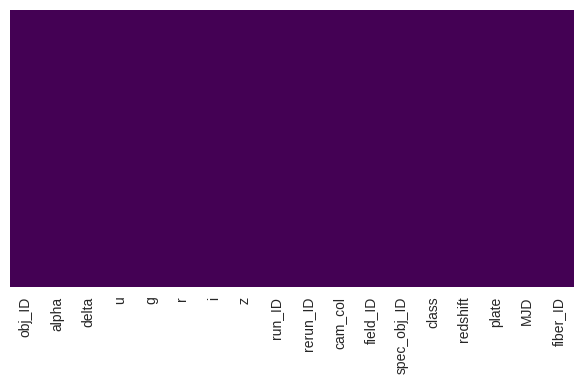

In [ ]:
#Visualizing - NaN values - NULL
import seaborn as sns
import matplotlib.pyplot as plt
def get_heatmap(df):
    #This function gives heatmap of all NaN values
    plt.figure(figsize=(6,4))
    sns.heatmap(df.isnull(), yticklabels=False, cbar=False, cmap='viridis')
    plt.tight_layout()
    return plt.show()
get_heatmap(df)

In [ ]:
df = df.drop(columns=['obj_ID'])
df=df.drop(columns=['rerun_ID'])
df=df.drop(columns=['cam_col'])

In [ ]:
df.columns

Index(['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID', 'field_ID',
       'spec_obj_ID', 'class', 'redshift', 'plate', 'MJD', 'fiber_ID'],
      dtype='object')

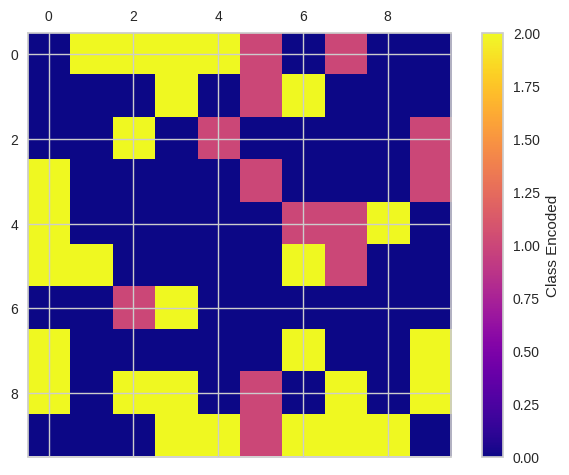

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
df['class_encoded'] = label_encoder.fit_transform(df['class'])
num_samples = 100
grid_height = 10
grid_width = 10
sample_data = df['class_encoded'].sample(n=num_samples, random_state=42)
data_grid = np.reshape(sample_data.values, (grid_height, grid_width))

fig, ax = plt.subplots()
cax = ax.matshow(data_grid, cmap='plasma')

plt.colorbar(cax, label="Class Encoded")

plt.show()


<Figure size 800x550 with 0 Axes>

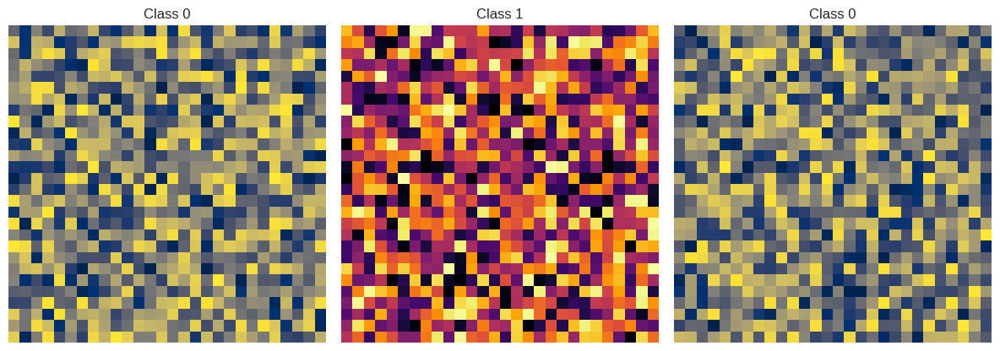

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
numeric_data = np.random.random((10, 28, 28))
class_labels = [0, 1, 0, 1, 2, 2, 1,1,0,2]
grid_height = 1
grid_width = 3
class_colors = {
    0: 'cividis',
    1: 'inferno',
    2: 'magma'

}
plt.clf()
fig, axes = plt.subplots(grid_height, grid_width, figsize=(12, 6))

axes = axes.ravel()

for i in range(grid_height * grid_width):
    ax = axes[i]
    ax.axis('off')

    if i < len(numeric_data):
        image = numeric_data[i]
        label = class_labels[i]
        color = class_colors.get(label, 'viridis')
        ax.imshow(image, cmap=color, aspect='equal')
        ax.set_title(f"Class {label}")
    else:
        ax.axis('off')

plt.tight_layout()
plt.show()


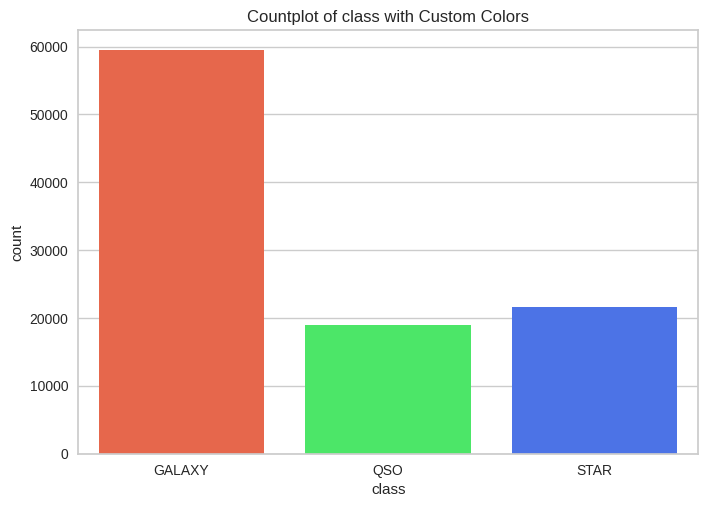

In [ ]:
custom_palette = ["#FF5733", "#33FF57", "#3366FF"]
category = "class"
plt.figure()
sns.countplot(x=category, data=df, palette=custom_palette)
plt.title(f'Countplot of {category} with Custom Colors')
plt.show()

In [ ]:
df["class"].value_counts()

GALAXY    59445
STAR      21594
QSO       18961
Name: class, dtype: int64

In [ ]:
df["class"]=[0 if i == "GALAXY" else 1 if i == "STAR" else 2 for i in df["class"]]

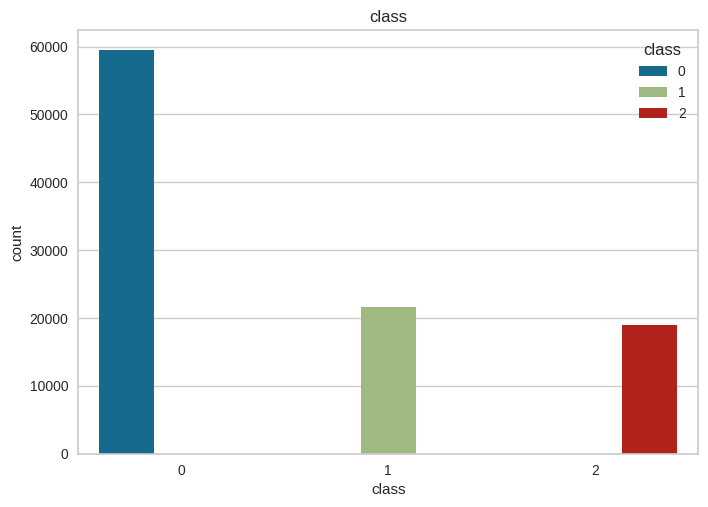

In [ ]:
cat=["class"]
df_cat = df.loc[:, cat]
for i in cat:
    plt.figure()
    sns.countplot(x = i, data = df_cat,hue = "class")
    plt.title(i)

In [ ]:
import plotly.express as ex
custom_colors = ["#FF5733", "#33FF57", "#3366FF"]
ex.pie(df,names='class',title='Distribution of the target variable. "Class"',hole=0.33,color_discrete_sequence=custom_colors)

In [ ]:
df.columns

Index(['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID', 'field_ID',
       'spec_obj_ID', 'class', 'redshift', 'plate', 'MJD', 'fiber_ID',
       'class_encoded'],
      dtype='object')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 16 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   alpha          100000 non-null  float64
 1   delta          100000 non-null  float64
 2   u              100000 non-null  float64
 3   g              100000 non-null  float64
 4   r              100000 non-null  float64
 5   i              100000 non-null  float64
 6   z              100000 non-null  float64
 7   run_ID         100000 non-null  int64  
 8   field_ID       100000 non-null  int64  
 9   spec_obj_ID    100000 non-null  float64
 10  class          100000 non-null  int64  
 11  redshift       100000 non-null  float64
 12  plate          100000 non-null  int64  
 13  MJD            100000 non-null  int64  
 14  fiber_ID       100000 non-null  int64  
 15  class_encoded  100000 non-null  int64  
dtypes: float64(9), int64(7)
memory usage: 12.2 MB


In [ ]:
correlation_matrix = df.corr()

In [ ]:
correlation_matrix['class'].sort_values(ascending = False)

class            1.000000
class_encoded    0.685952
redshift         0.536822
i                0.284396
plate            0.215722
spec_obj_ID      0.215722
MJD              0.207262
r                0.150691
delta            0.056643
fiber_ID         0.032053
z                0.017352
alpha            0.004552
run_ID          -0.000049
g               -0.005915
u               -0.017701
field_ID        -0.038044
Name: class, dtype: float64

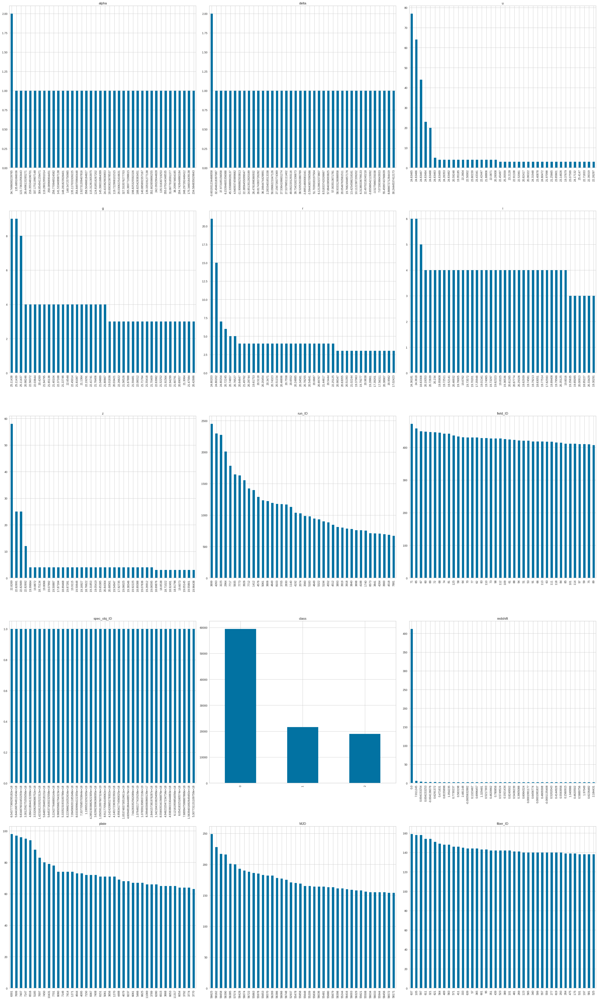

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

attributes = ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID',  'field_ID', 'spec_obj_ID', 'class', 'redshift', 'plate', 'MJD', 'fiber_ID']

max_unique_values = 40
num_attributes = len(attributes)
num_cols = 3
num_rows = (num_attributes + num_cols - 1) // num_cols
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(30, 10 * num_rows))
for i, attr in enumerate(attributes):
    row = i // num_cols
    col = i % num_cols
    unique_values = df[attr].value_counts().head(max_unique_values)
    unique_values.plot(kind='bar', ax=axes[row, col])
    axes[row, col].set_title(attr)
plt.tight_layout()
plt.show()


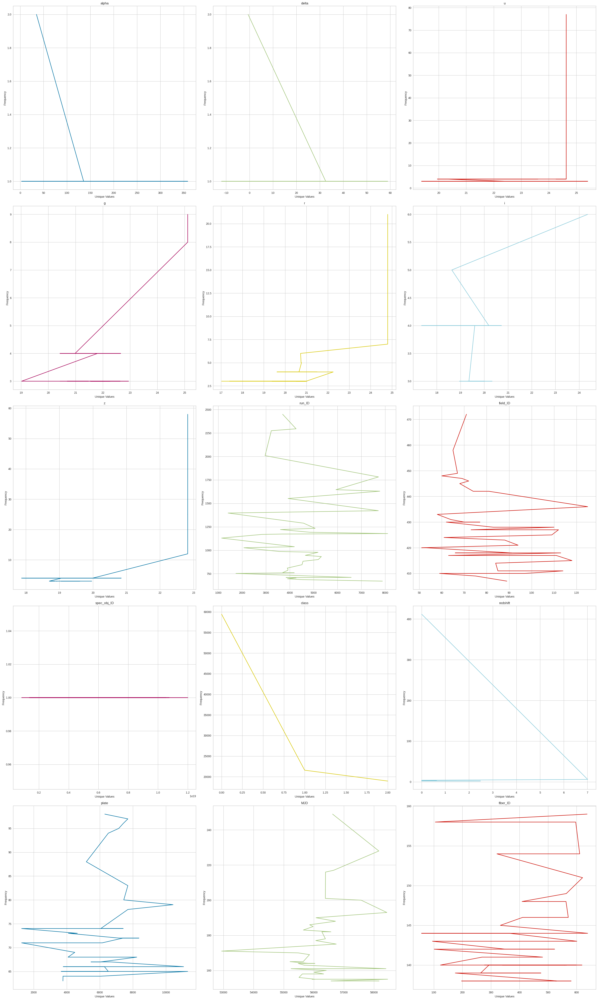

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from itertools import cycle

colors = cycle(plt.rcParams['axes.prop_cycle'].by_key()['color'])

attributes = ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID', 'field_ID', 'spec_obj_ID', 'class', 'redshift', 'plate', 'MJD', 'fiber_ID']

max_unique_values = 40
num_attributes = len(attributes)
num_cols = 3
num_rows = (num_attributes + num_cols - 1) // num_cols
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(30, 10 * num_rows))
for i, attr in enumerate(attributes):
    row = i // num_cols
    col = i % num_cols
    unique_values = df[attr].value_counts().head(max_unique_values)
    unique_values.plot(kind='line', ax=axes[row, col], color=next(colors))
    axes[row, col].set_title(attr)
    axes[row, col].set_xlabel("Unique Values")
    axes[row, col].set_ylabel("Frequency")
plt.tight_layout()
plt.show()


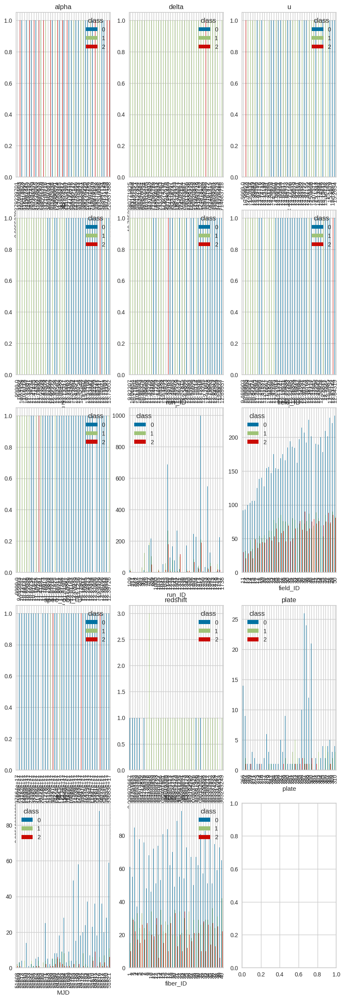

In [ ]:
attributes = ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID',  'field_ID', 'spec_obj_ID', 'redshift', 'plate', 'MJD', 'fiber_ID']
target_attribute = 'class'
max_unique_values = 40
num_attributes = len(attributes)
num_cols = 3
num_rows = (num_attributes + num_cols - 1) // num_cols
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(10, 6 * num_rows))
for i, attr in enumerate(attributes):
    row = i // num_cols
    col = i % num_cols
    grouped_data = df.groupby([attr, target_attribute]).size().unstack()
    grouped_data.head(max_unique_values).plot(kind='bar', ax=axes[row, col])
    axes[row, col].set_title(attr)
plt.tight_layout
plt.show()

<Figure size 10000x10000 with 0 Axes>

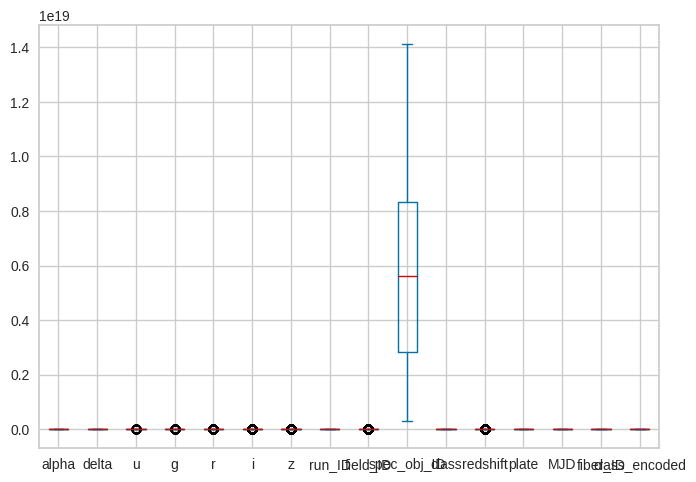

<Figure size 10000x10000 with 0 Axes>

In [ ]:
df.plot.box()
plt.figure(figsize=(100,100))

<Axes: >

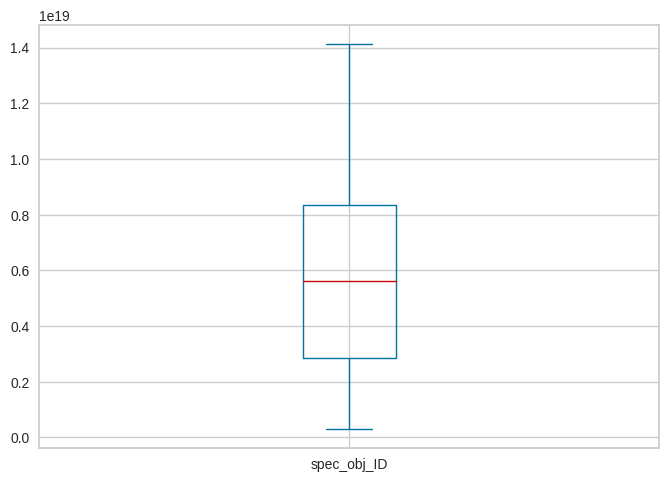

In [ ]:
df.spec_obj_ID .plot.box()

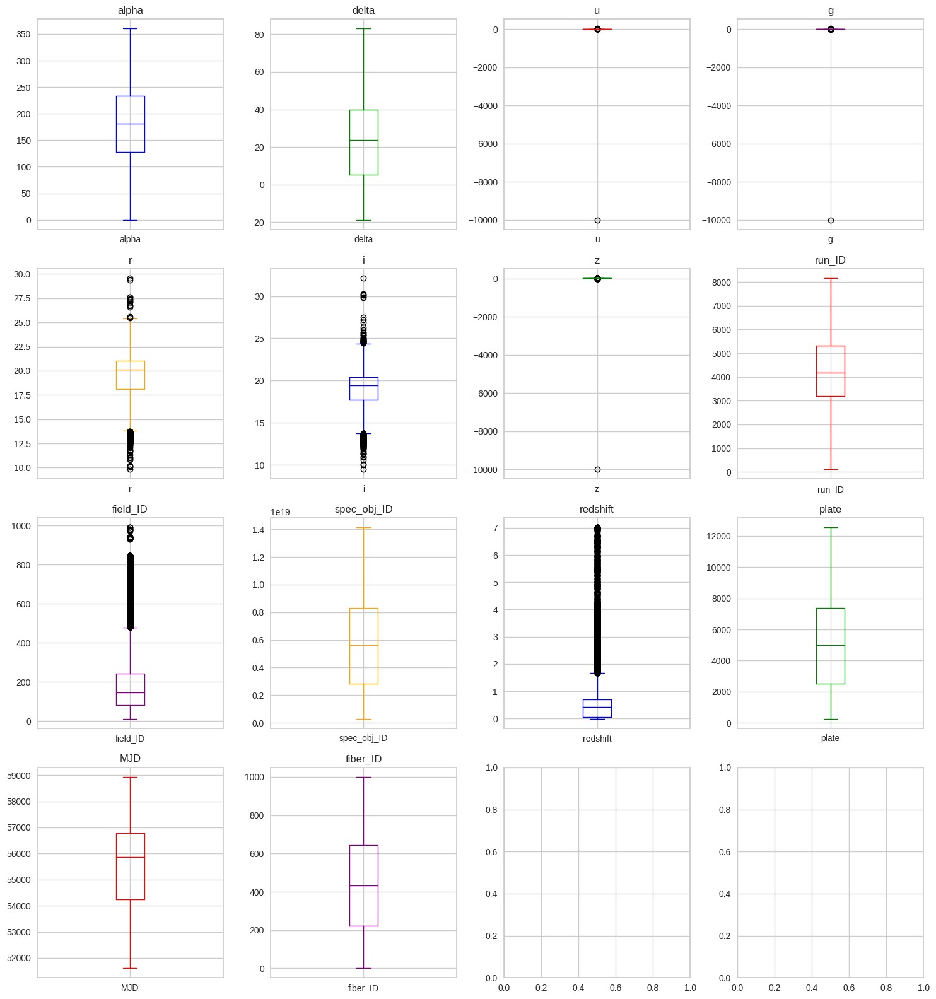

In [ ]:
import matplotlib.pyplot as plt

columns = ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID',   'field_ID', 'spec_obj_ID', 'redshift', 'plate', 'MJD', 'fiber_ID']
num_columns = len(columns)
num_rows = (num_columns + 3) // 4
fig, axes = plt.subplots(nrows=num_rows, ncols=4, figsize=(15, 4 * num_rows))


colors = ['blue', 'green', 'red', 'purple', 'orange']
for i, column in enumerate(columns):
    ax = axes[i // 4, i % 4]
    df.boxplot(column=column, ax=ax, color=colors[i % len(colors)])
    ax.set_title(column)

plt.tight_layout()
plt.show()


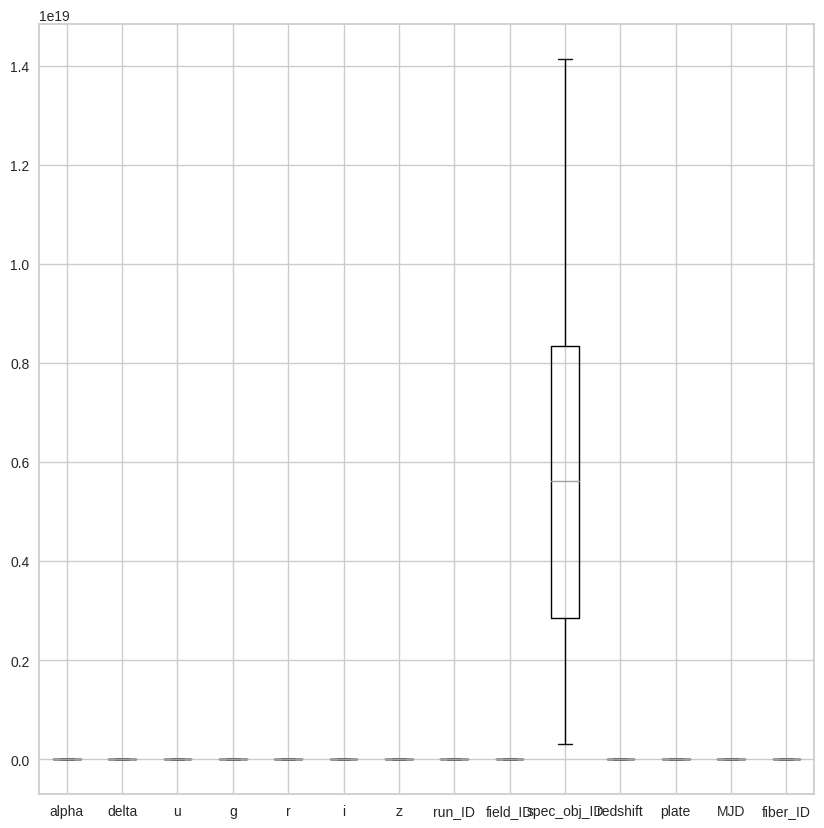

In [ ]:

columns = ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID',  'field_ID', 'spec_obj_ID', 'redshift', 'plate', 'MJD', 'fiber_ID']
df.boxplot(column=columns, showfliers=False, figsize=(10, 10))
plt.show()

<Axes: ylabel='Frequency'>

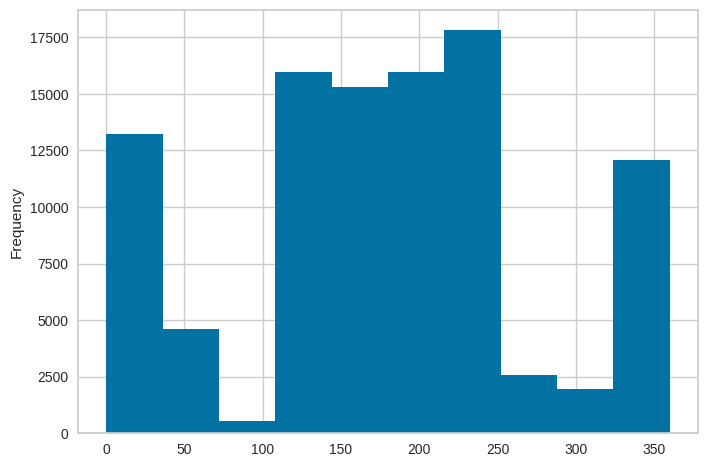

In [ ]:
df.alpha.plot.hist(bins=10)

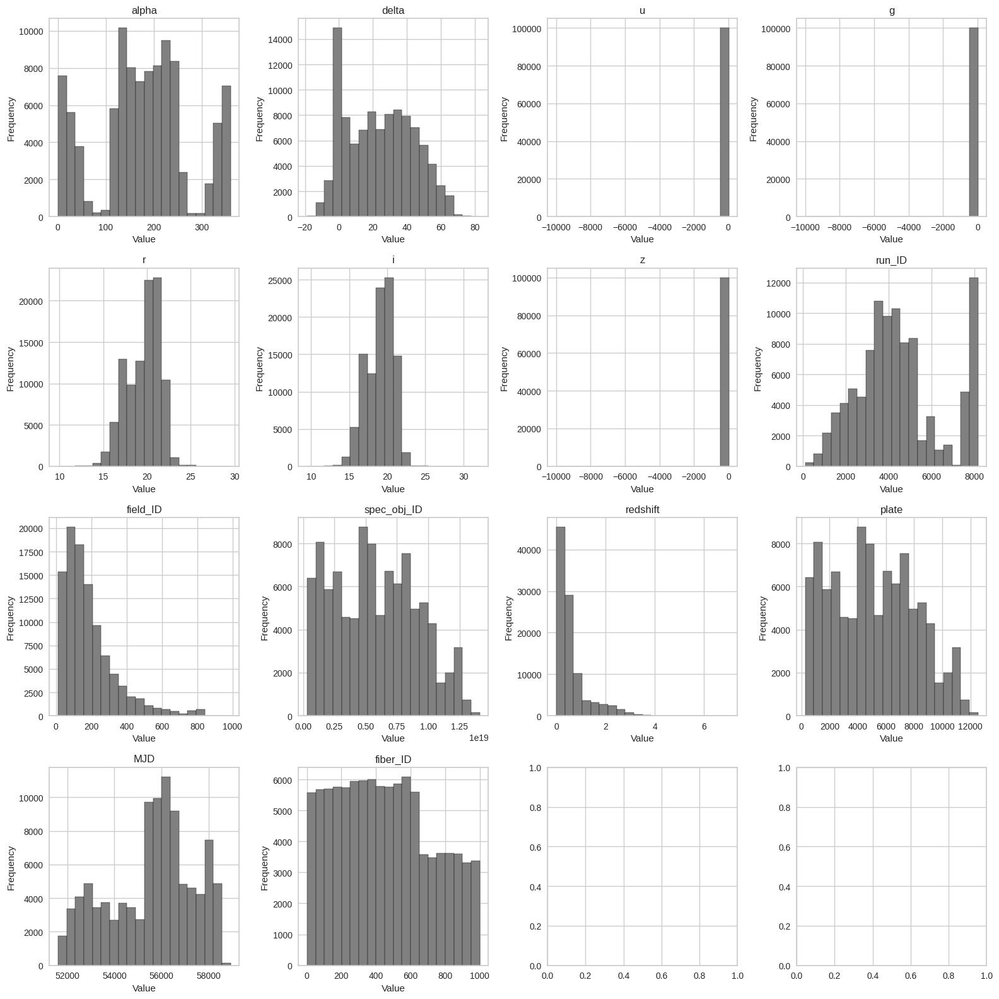

In [ ]:

columns = ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID',   'field_ID', 'spec_obj_ID', 'redshift','plate', 'MJD', 'fiber_ID']
num_subplots_per_row = 4
num_rows = (len(columns) + num_subplots_per_row - 1) // num_subplots_per_row
fig, axes = plt.subplots(num_rows, num_subplots_per_row, figsize=(16, 4 * num_rows))
axes = axes.flatten()
for i, column in enumerate(columns):
    axes[i].hist(df[column], bins=20, color='grey', edgecolor='black')
    axes[i].set_title(column)
    axes[i].set_xlabel("Value")
    axes[i].set_ylabel("Frequency")
plt.tight_layout()
plt.show()

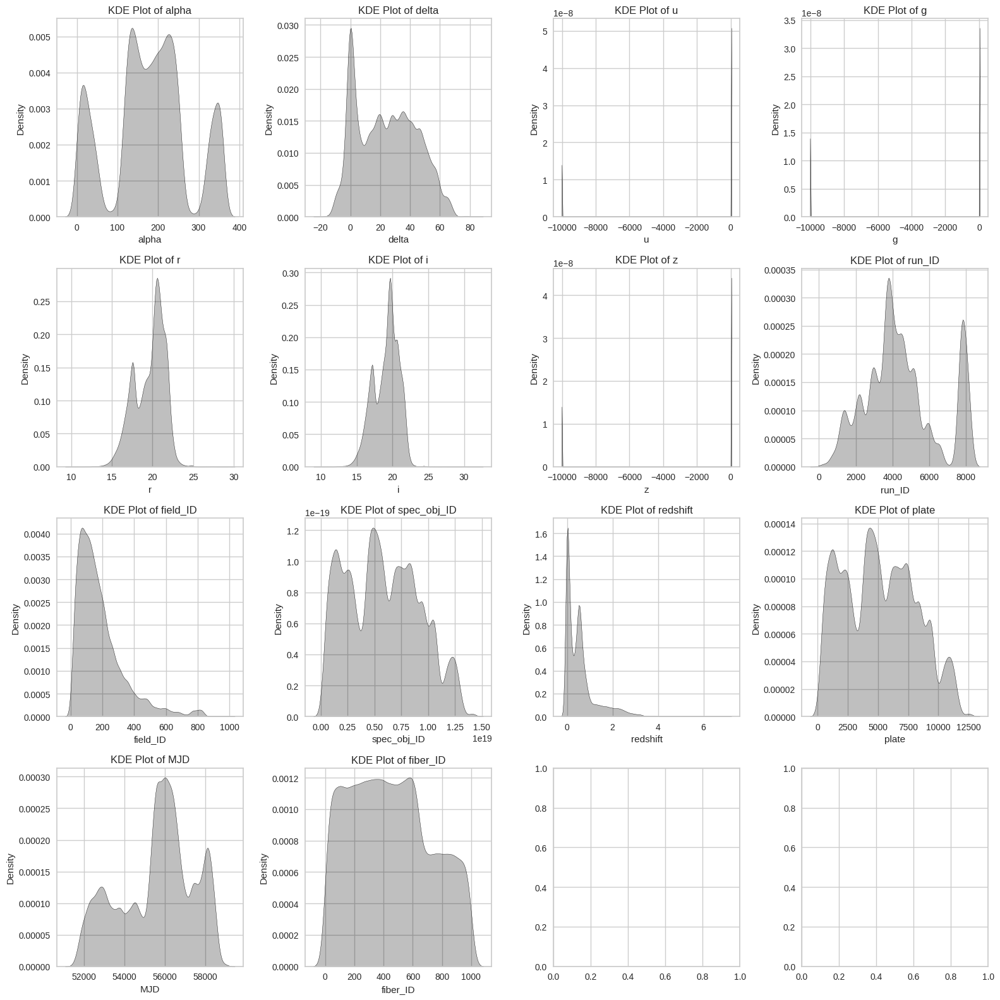

In [ ]:

columns = ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID',   'field_ID', 'spec_obj_ID', 'redshift', 'plate', 'MJD', 'fiber_ID']
num_subplots_per_row = 4
num_rows = (len(columns) + num_subplots_per_row - 1) // num_subplots_per_row
fig, axes = plt.subplots(num_rows, num_subplots_per_row, figsize=(16, 4 * num_rows))
axes = axes.flatten()
for i, column in enumerate(columns):
    sns.kdeplot(data=df, x=column, ax=axes[i], color='black', fill=True)
    axes[i].set_title(f'KDE Plot of {column}')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel("Density")
plt.tight_layout()
plt.show()

array([[<Axes: title={'center': 'alpha'}>,
        <Axes: title={'center': 'delta'}>, <Axes: title={'center': 'u'}>,
        <Axes: title={'center': 'g'}>],
       [<Axes: title={'center': 'r'}>, <Axes: title={'center': 'i'}>,
        <Axes: title={'center': 'z'}>,
        <Axes: title={'center': 'run_ID'}>],
       [<Axes: title={'center': 'field_ID'}>,
        <Axes: title={'center': 'spec_obj_ID'}>,
        <Axes: title={'center': 'class'}>,
        <Axes: title={'center': 'redshift'}>],
       [<Axes: title={'center': 'plate'}>,
        <Axes: title={'center': 'MJD'}>,
        <Axes: title={'center': 'fiber_ID'}>,
        <Axes: title={'center': 'class_encoded'}>]], dtype=object)

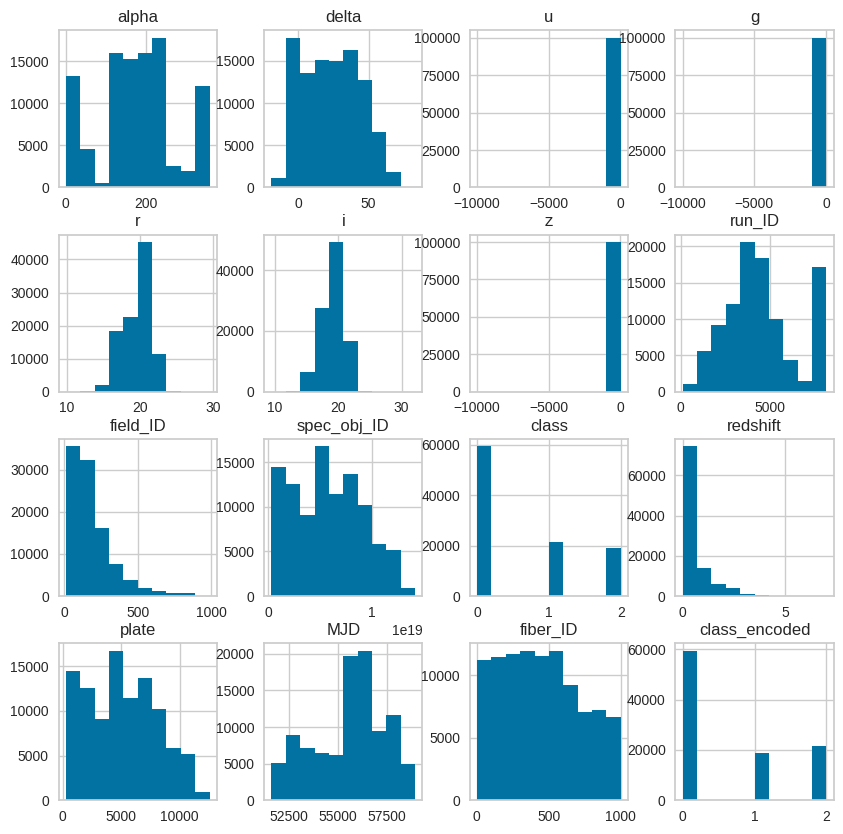

In [ ]:
df.hist(figsize=(10, 10))


<Axes: >

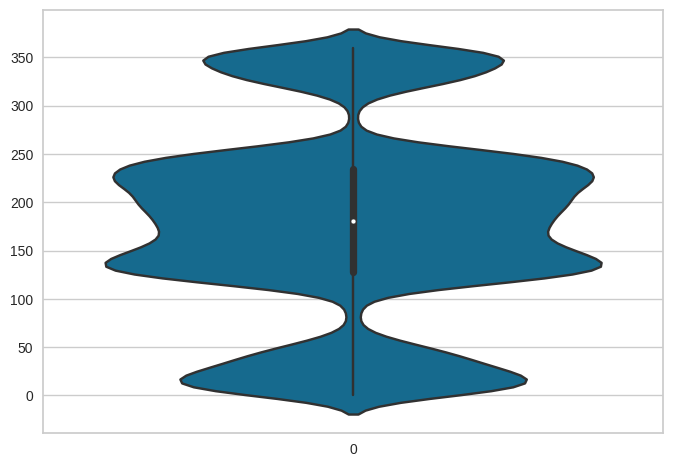

In [ ]:
sns.violinplot(data=df.alpha)


<Axes: >

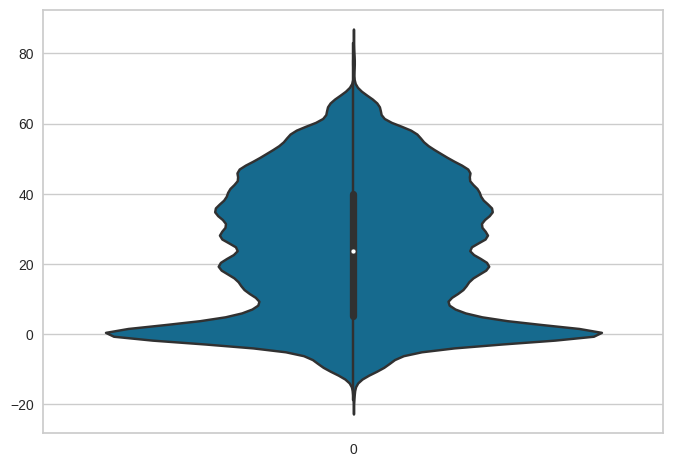

In [ ]:
sns.violinplot(data=df.delta)

<Axes: >

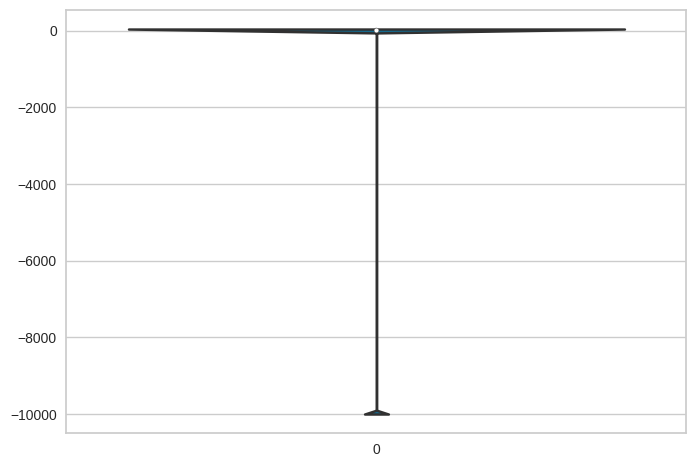

In [ ]:
sns.violinplot(data=df.u)

<Axes: >

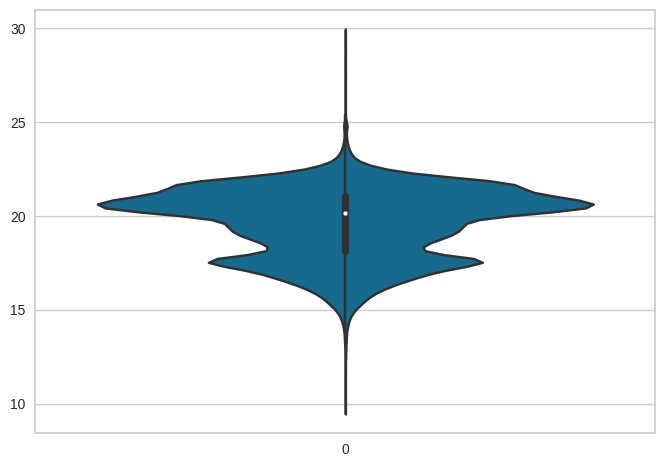

In [ ]:
sns.violinplot(data=df.r)

<Axes: xlabel='run_ID', ylabel='class'>

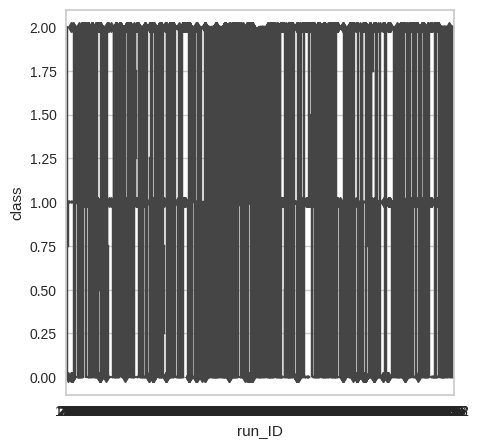

In [ ]:
plt.figure(figsize=(5,5))
sns.boxplot(x='run_ID',y='class',data=df)

<Axes: xlabel='alpha', ylabel='delta'>

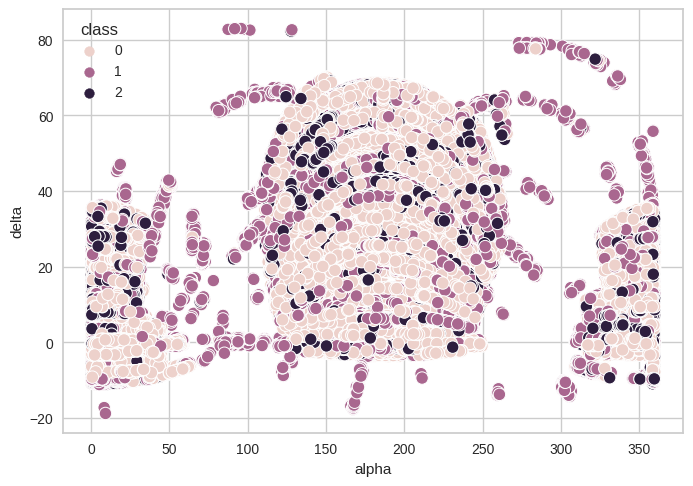

In [ ]:

sns.scatterplot(x='alpha',y ='delta',hue = 'class',data = df,s=80)

<Axes: xlabel='delta', ylabel='u'>

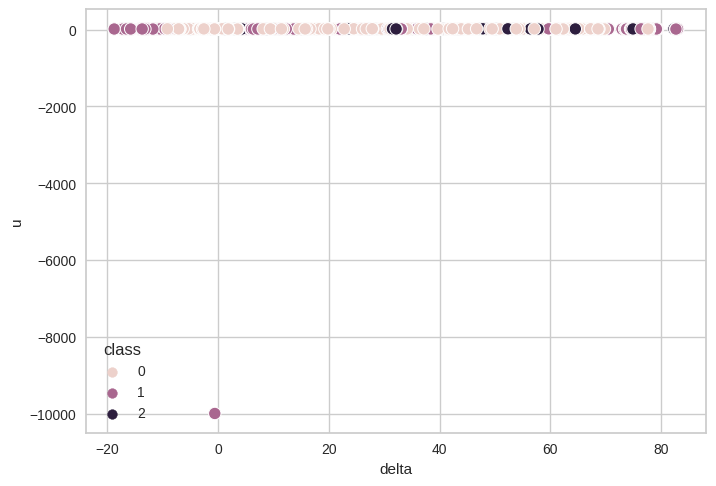

In [ ]:
sns.scatterplot(x='delta',y ='u',hue = 'class',data = df,s=80)

<Axes: xlabel='alpha', ylabel='run_ID'>

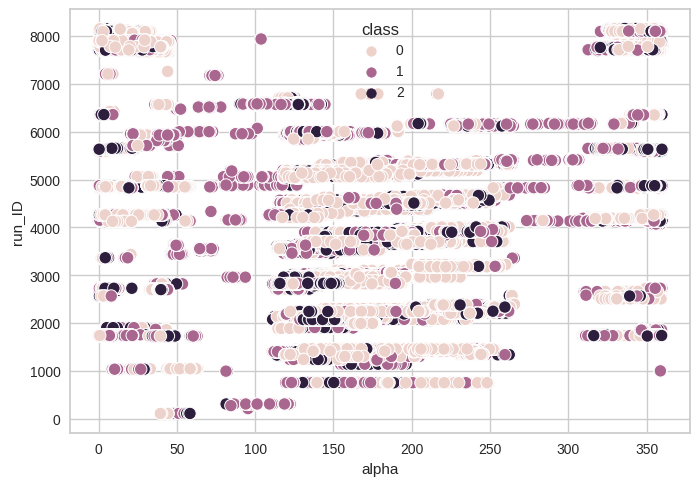

In [ ]:
sns.scatterplot(x='alpha',y ='run_ID',hue = 'class',data = df,s=80)

<Axes: xlabel='alpha', ylabel='plate'>

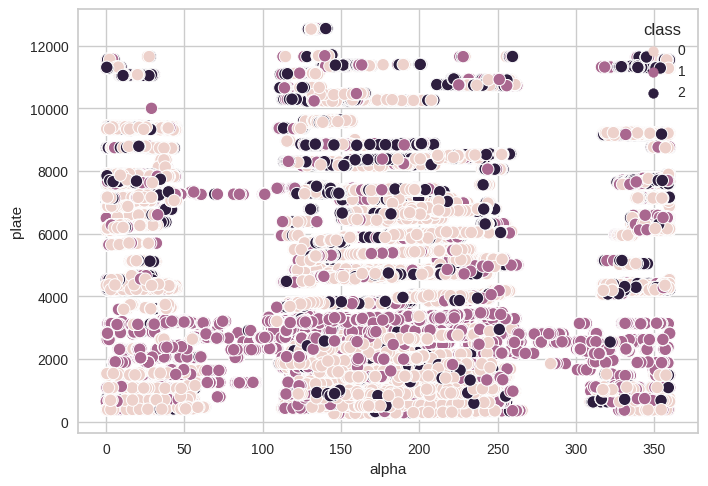

In [ ]:
sns.scatterplot(x='alpha',y ='plate',hue = 'class',data = df,s=80)

<Axes: xlabel='run_ID', ylabel='spec_obj_ID'>

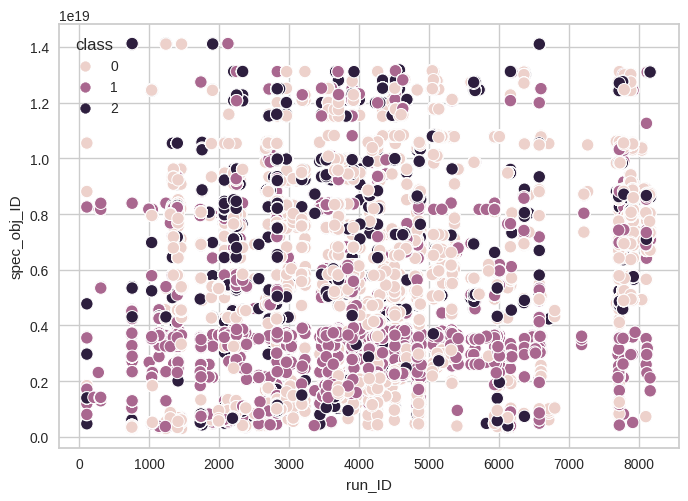

In [ ]:
sns.scatterplot(x='run_ID',y ='spec_obj_ID',hue = 'class',data = df,s=80)

<Axes: xlabel='field_ID', ylabel='redshift'>

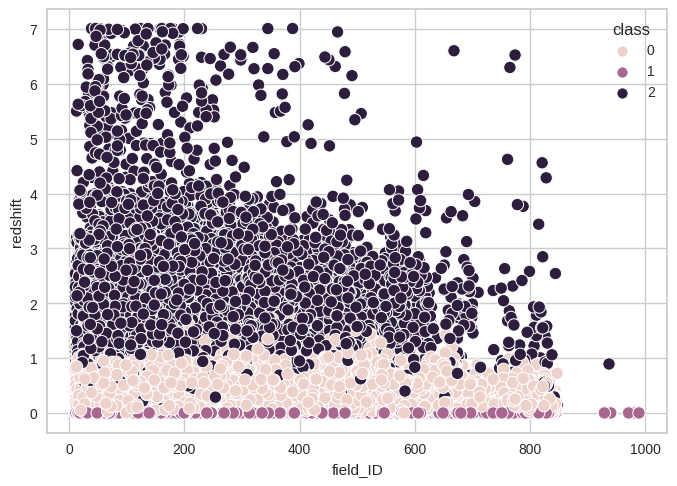

In [ ]:
sns.scatterplot(x='field_ID',y ='redshift',hue = 'class',data = df,s=80)

<Axes: xlabel='delta', ylabel='fiber_ID'>

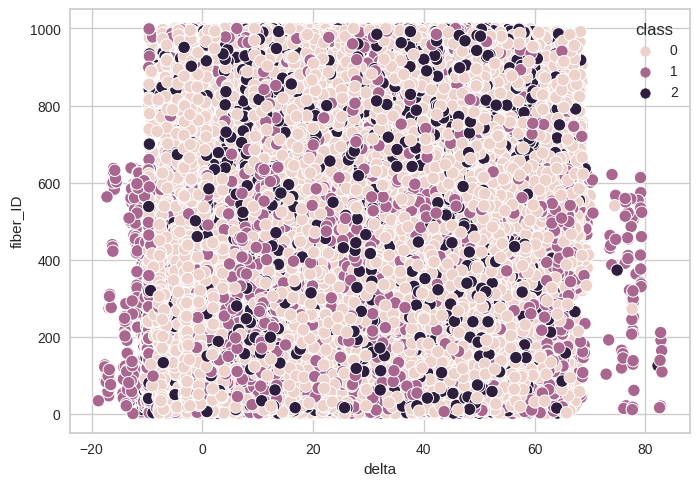

In [ ]:
sns.scatterplot(x='delta',y ='fiber_ID',hue = 'class',data = df,s=80)

<Axes: xlabel='plate', ylabel='MJD'>

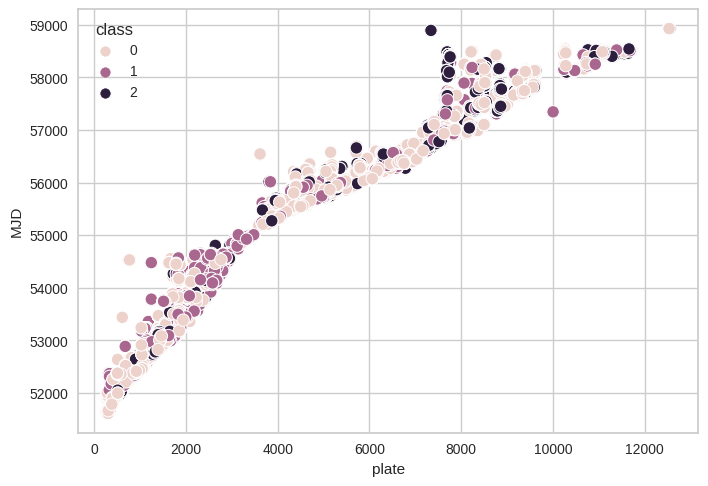

In [ ]:
sns.scatterplot(x='plate',y ='MJD',hue = 'class',data = df,s=80)

In [ ]:
df.head()

,alpha,delta,u,g,r,i,z,run_ID,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID,class_encoded
0,135.689107,32.494632,23.87882,22.27530,20.39501,19.16573,18.79371,3606,79,6.543777e+18,0,0.634794,5812,56354,171,0
1,144.826101,31.274185,24.77759,22.83188,22.58444,21.16812,21.61427,4518,119,1.176014e+19,0,0.779136,10445,58158,427,0
2,142.188790,35.582444,25.26307,22.66389,20.60976,19.34857,18.94827,3606,120,5.152200e+18,0,0.644195,4576,55592,299,0
3,338.741038,-0.402828,22.13682,23.77656,21.61162,20.50454,19.25010,4192,214,1.030107e+19,0,0.932346,9149,58039,775,0
4,345.282593,21.183866,19.43718,17.58028,16.49747,15.97711,15.54461,8102,137,6.891865e+18,0,0.116123,6121,56187,842,0


<Axes: xlabel='alpha', ylabel='class'>

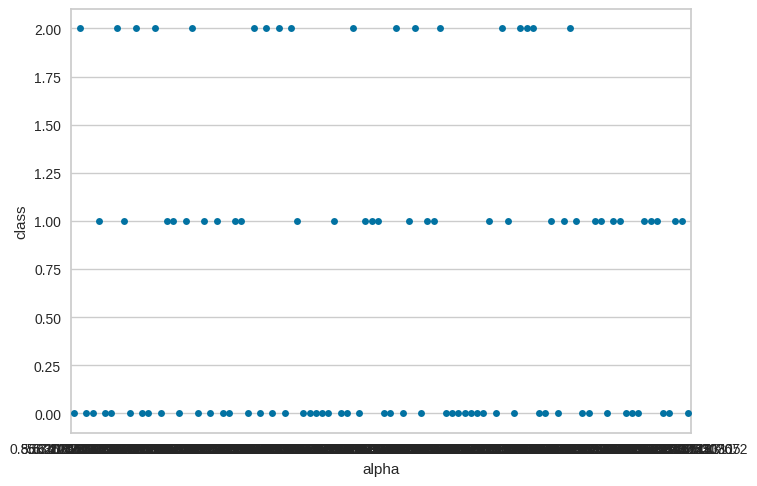

In [ ]:
sns.swarmplot(y='class', x='alpha', data=df.sample(100))

<Axes: xlabel='alpha', ylabel='run_ID'>

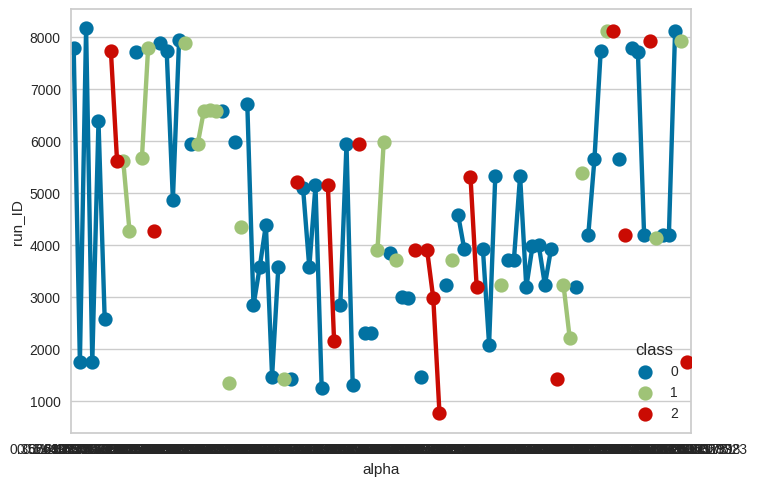

In [ ]:
sns.pointplot(x='alpha',y='run_ID',hue='class',data=df.sample(100))

<Axes: xlabel='i', ylabel='u'>

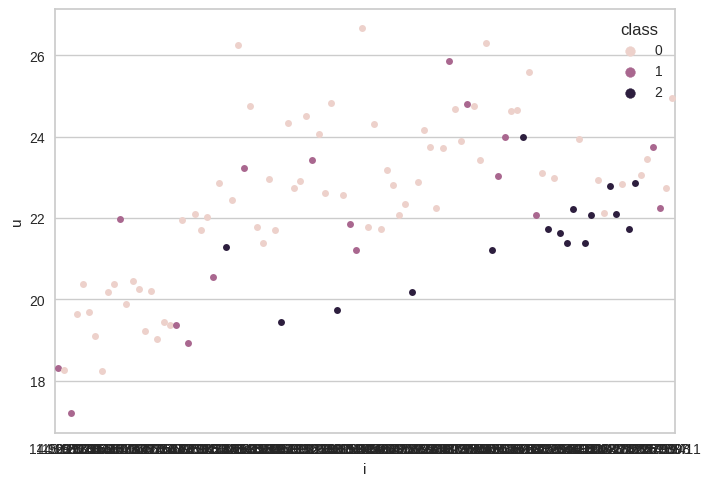

In [ ]:
sns.stripplot(y='u',x='i',hue='class',data=df.sample(100))

<Axes: xlabel='z', ylabel='g'>

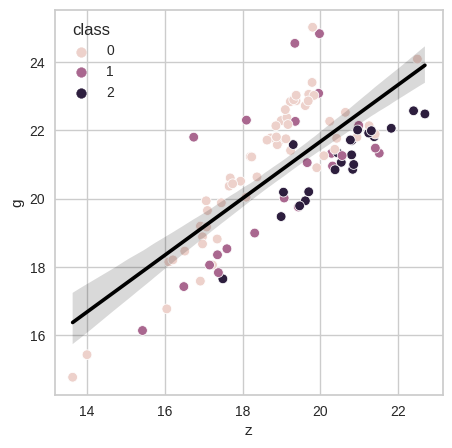

In [ ]:
sample_df = df.sample(100)
plt.figure(figsize=(5, 5))
sns.scatterplot(data=sample_df, x='z', y='g', hue='class')
sns.regplot(data=sample_df, x='z', y='g',scatter=False, color='black')

<Axes: xlabel='field_ID', ylabel='spec_obj_ID'>

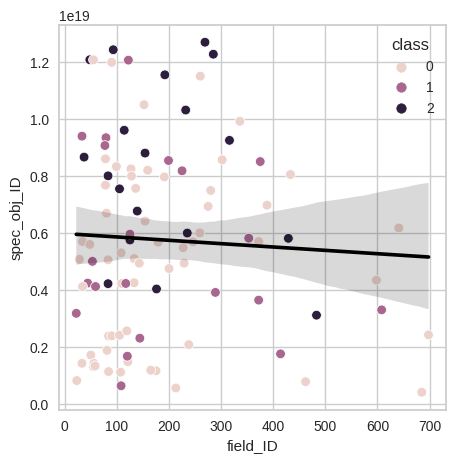

In [ ]:
sample_df = df.sample(100)
plt.figure(figsize=(5, 5))
sns.scatterplot(data=sample_df, x='field_ID', y='spec_obj_ID', hue='class')
sns.regplot(data=sample_df, x='field_ID', y='spec_obj_ID',scatter=False, color='black')

<Axes: >

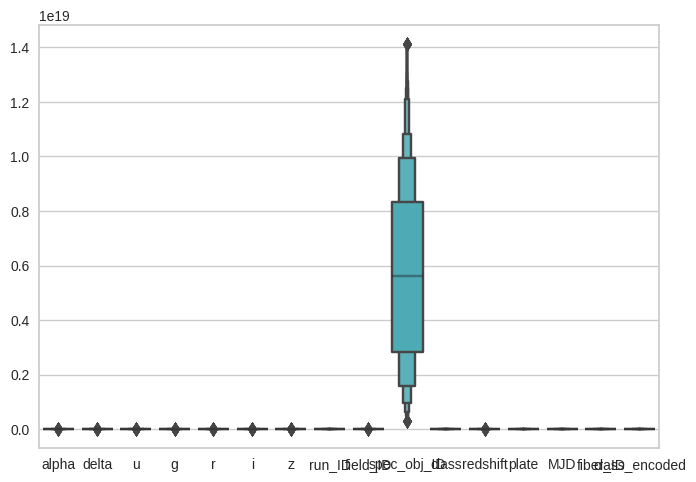

In [ ]:
sns.boxenplot(data=df)

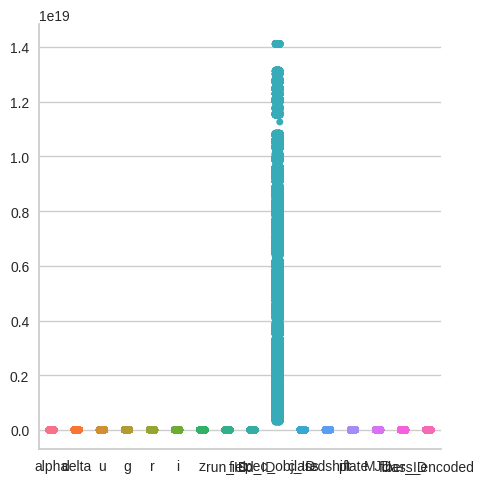

In [ ]:
sns.catplot(data=df)

<Axes: >

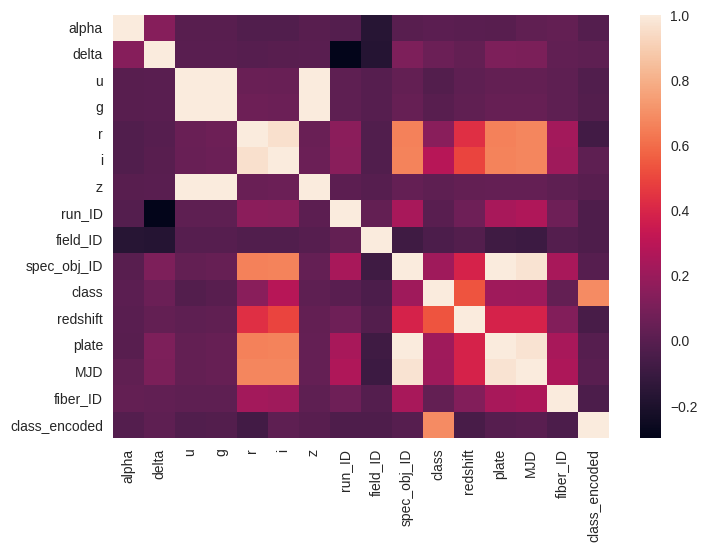

In [ ]:
sns.heatmap(df.corr())

<Axes: >

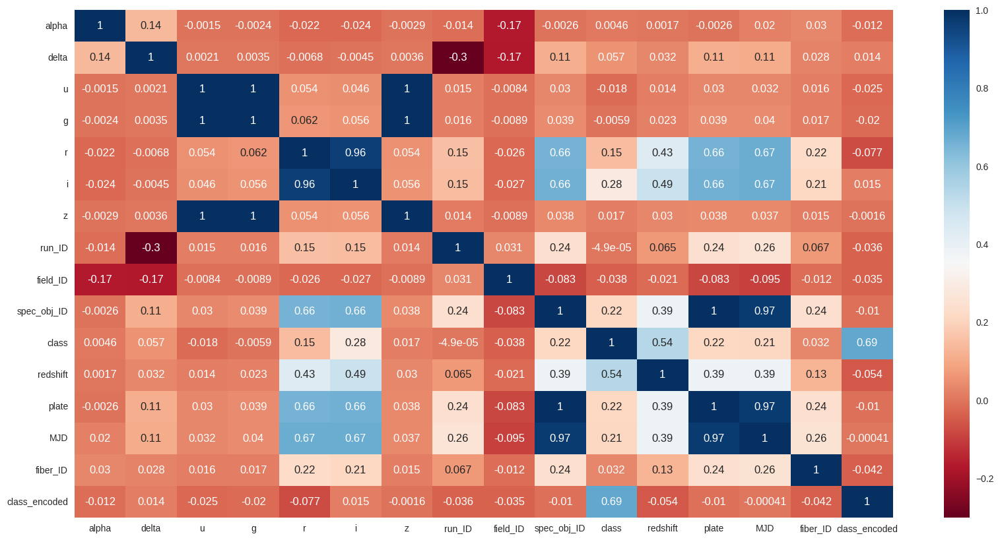

In [ ]:
plt.figure(figsize=(20,10))
sns.heatmap(df.corr(),annot=True,cmap='RdBu')

<Axes: ylabel='count'>

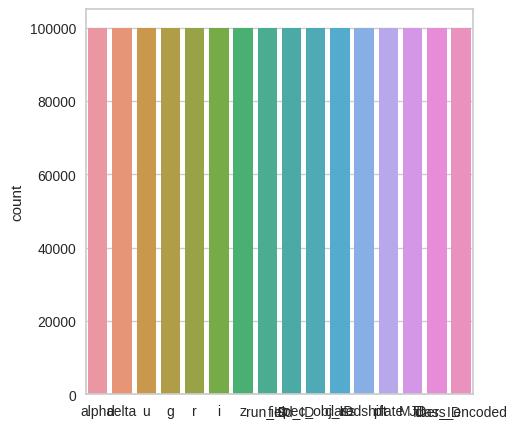

In [ ]:
plt.figure(figsize=(5, 5))
sns.countplot(data=df)

In [ ]:
df.head

<bound method NDFrame.head of             alpha      delta         u         g         r         i  \
0      135.689107  32.494632  23.87882  22.27530  20.39501  19.16573   
1      144.826101  31.274185  24.77759  22.83188  22.58444  21.16812   
2      142.188790  35.582444  25.26307  22.66389  20.60976  19.34857   
3      338.741038  -0.402828  22.13682  23.77656  21.61162  20.50454   
4      345.282593  21.183866  19.43718  17.58028  16.49747  15.97711   
...           ...        ...       ...       ...       ...       ...   
99995   39.620709  -2.594074  22.16759  22.97586  21.90404  21.30548   
99996   29.493819  19.798874  22.69118  22.38628  20.45003  19.75759   
99997  224.587407  15.700707  21.16916  19.26997  18.20428  17.69034   
99998  212.268621  46.660365  25.35039  21.63757  19.91386  19.07254   
99999  196.896053  49.464643  22.62171  21.79745  20.60115  20.00959   

              z  run_ID  field_ID   spec_obj_ID  class  redshift  plate  \
0      18.79371    3606       

<Figure size 500x500 with 0 Axes>

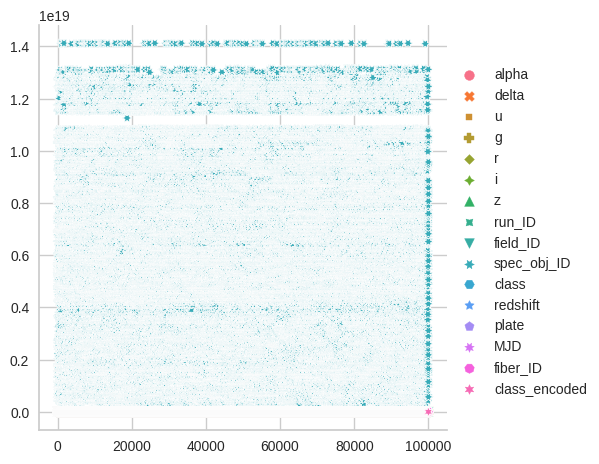

In [ ]:
plt.figure(figsize=(5, 5))
sns.relplot(data=df)

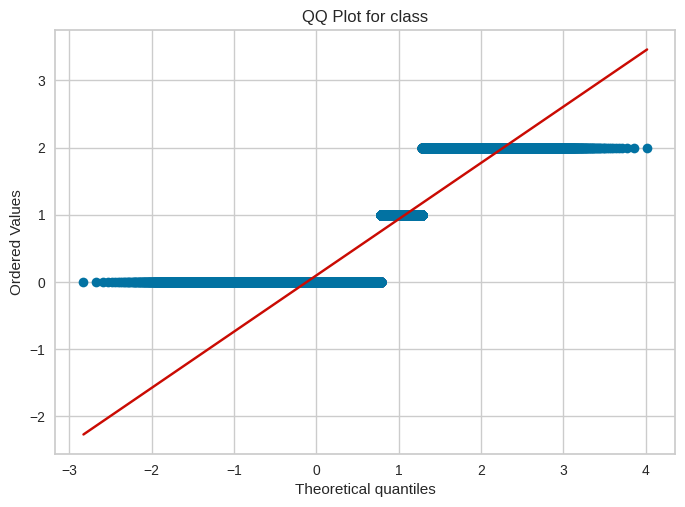

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as stats

# Load the data into a DataFrame


column_name ='class'
data_column = df[column_name]

# Create a theoretical normal distribution for comparison
mean = data_column.mean()
std = data_column.std()
theoretical_dist = stats.norm(loc=mean, scale=std)

# Create a QQ plot
stats.probplot(data_column, dist=theoretical_dist, plot=plt)
plt.title(f'QQ Plot for {column_name}')
plt.show()


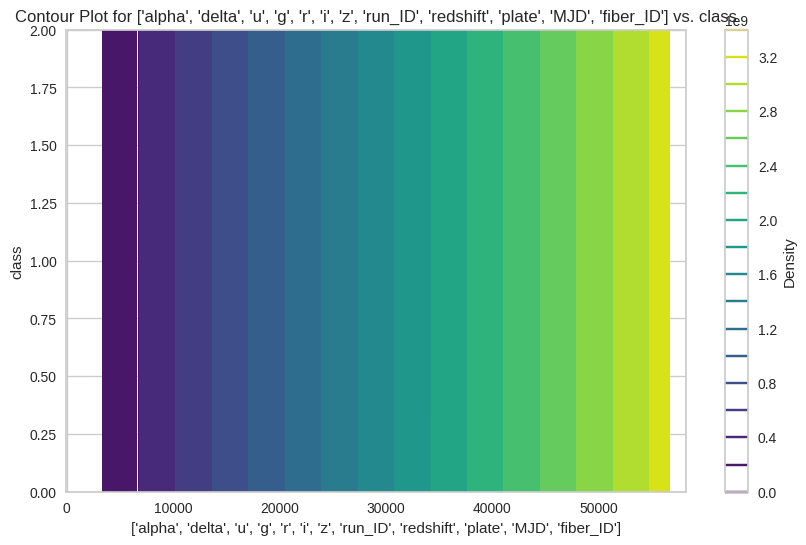

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
x_column =  ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID', 'redshift', 'plate', 'MJD', 'fiber_ID']
y_column = 'class'
grid_size = 100
x = df[x_column].sample(grid_size)
y = df[y_column].sample(grid_size)
X, Y = np.meshgrid(x, y)
Z = (X - Y)**2
plt.figure(figsize=(10, 6))
contour = plt.contour(X, Y, Z, levels=20, cmap='viridis')
plt.xlabel(x_column)
plt.ylabel(y_column)
plt.title('Contour Plot for {} vs. {}'.format(x_column, y_column))
cbar = plt.colorbar(contour)
cbar.set_label('Density')
plt.show()


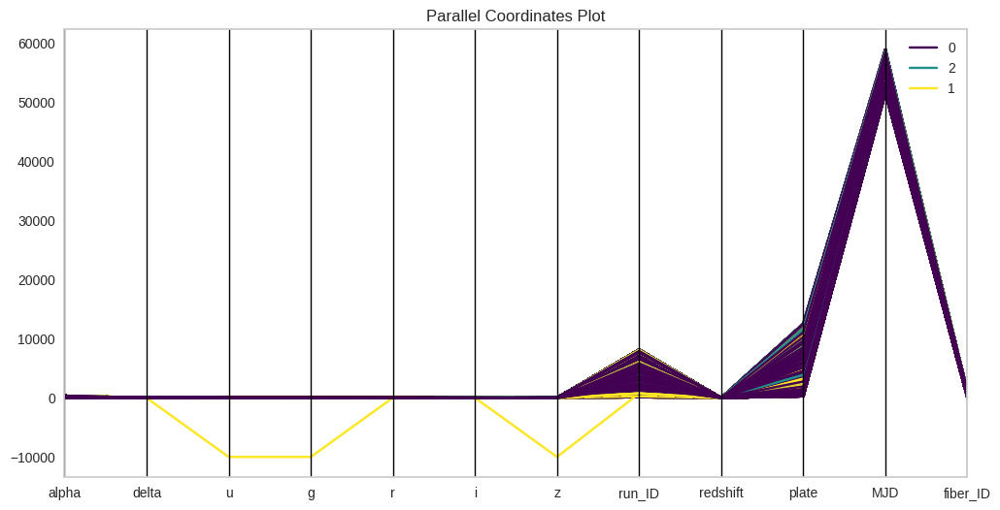

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
columns =  ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID', 'class','redshift', 'plate', 'MJD', 'fiber_ID']# Add 'class' to color lines by class
data = df.dropna()
if 'class' in data.columns:
    plt.figure(figsize=(12, 6))
    pd.plotting.parallel_coordinates(data[columns], 'class', colormap='viridis')
    plt.title('Parallel Coordinates Plot')
    plt.show()
else:
    print("The 'class' column does not exist in your dataset or may not be appropriate for classification.")


In [ ]:
!pip install empiricaldist

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for empiricaldist: filename=empiricaldist-0.6.8-py3-none-any.whl size=12108 sha256=ff78e85546aaabb277b0f6a8418e7be1102564383a92d1a962e9850448ae6405
  Stored in directory: /root/.cache/pip/wheels/ba/30/d8/653166652404970cf48ec032ff1e90784bb804739d1834fc01
Successfully built empiricaldist


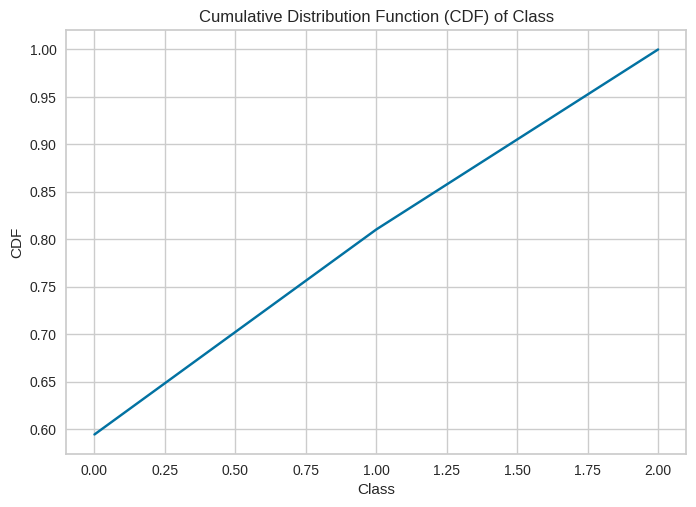

In [ ]:
from empiricaldist import Cdf
class_data = df['class']

cdf = Cdf.from_seq(class_data)

cdf.plot()
plt.xlabel('Class')
plt.ylabel('CDF')
plt.title('Cumulative Distribution Function (CDF) of Class')
plt.show()


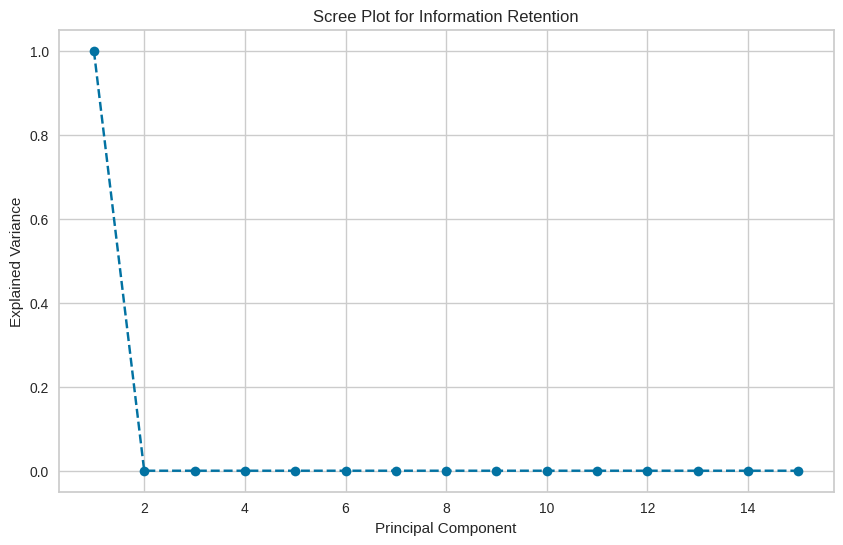

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
features = df.drop('class', axis=1)
pca = PCA()
pca.fit(features)
explained_variance = pca.explained_variance_ratio_
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='--')
plt.title('Scree Plot for Information Retention')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance')
plt.grid(True)
plt.show()


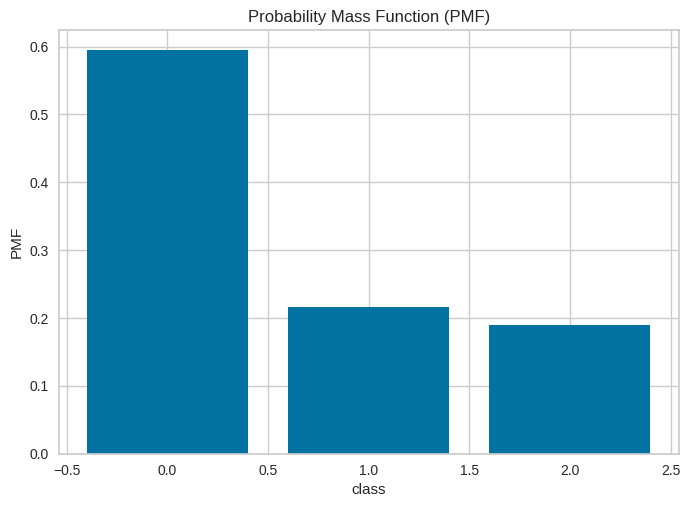

In [ ]:
from empiricaldist import Pmf
class_data = df['class']

pmf = Pmf.from_seq(class_data)

pmf.bar()
plt.xlabel('class')
plt.ylabel('PMF')
plt.title('Probability Mass Function (PMF)')
plt.show()


<Figure size 2500x2500 with 0 Axes>

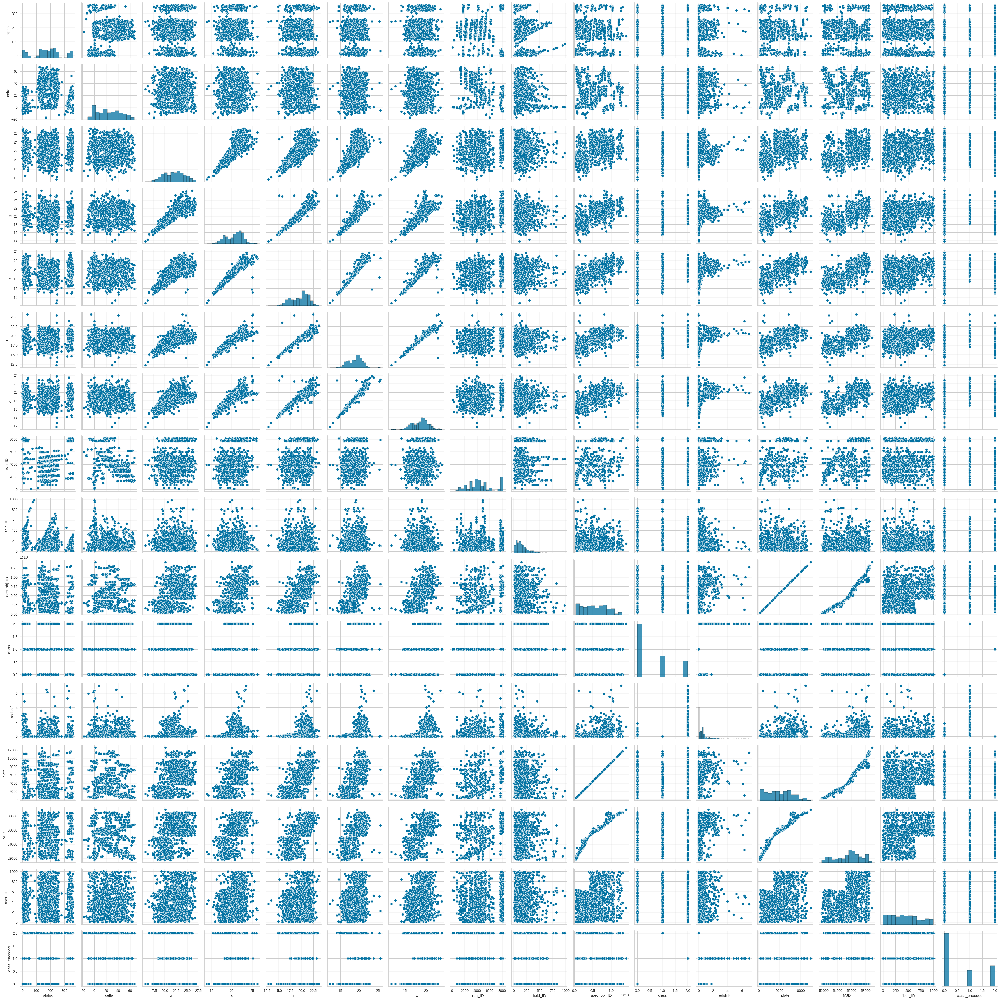

In [ ]:
plt.figure(figsize=(25, 25))
sns.pairplot(data=df.sample(1000))

In [ ]:
from sklearn.preprocessing import MinMaxScaler
features_to_scale = ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID', 'field_ID', 'spec_obj_ID', 'redshift', 'plate', 'MJD', 'fiber_ID']
scaler = MinMaxScaler()
df[features_to_scale] = scaler.fit_transform(df[features_to_scale])
print(df)

          alpha     delta         u         g         r         i         z  \
0      0.376905  0.503802  0.999113  0.999070  0.535344  0.427665  0.998944   
1      0.402286  0.491812  0.999202  0.999126  0.646203  0.515986  0.999225   
2      0.394960  0.534139  0.999251  0.999109  0.546218  0.435729  0.998959   
3      0.940947  0.180600  0.998939  0.999220  0.596946  0.486717  0.998990   
4      0.959118  0.392679  0.998670  0.998602  0.337999  0.287021  0.998620   
...         ...       ...       ...       ...       ...       ...       ...   
99995  0.110044  0.159072  0.998942  0.999140  0.611752  0.522045  0.999138   
99996  0.081913  0.379072  0.998994  0.999081  0.538130  0.453770  0.999006   
99997  0.623848  0.338810  0.998842  0.998771  0.424420  0.362588  0.998800   
99998  0.589629  0.642974  0.999259  0.999007  0.510982  0.423554  0.998927   
99999  0.546927  0.670525  0.998987  0.999023  0.545782  0.464886  0.998993   

         run_ID  field_ID  spec_obj_ID  class  reds

In [ ]:
from sklearn.preprocessing import StandardScaler
features_to_standardize = ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID', 'field_ID', 'spec_obj_ID', 'redshift', 'plate', 'MJD', 'fiber_ID']
scaler = StandardScaler()
df[features_to_standardize] = scaler.fit_transform(df[features_to_standardize])
print(df)

          alpha     delta         u         g         r         i         z  \
0     -0.434604  0.425529  0.059755  0.054926  0.403962  0.046007  0.003937   
1     -0.339921  0.363402  0.088045  0.072456  1.584406  1.185097  0.092835   
2     -0.367251  0.582713  0.103327  0.067165  0.519745  0.150019  0.008808   
3      1.669523 -1.249105  0.004921  0.102210  1.059904  0.807610  0.018321   
4      1.737310 -0.150242 -0.080055 -0.092948 -1.697421 -1.767887 -0.098468   
...         ...       ...       ...       ...       ...       ...       ...   
99995 -1.430113 -1.360650  0.005890  0.076991  1.217564  1.263237  0.065144   
99996 -1.535053 -0.220744  0.022371  0.058422  0.433626  0.382696  0.023527   
99997  0.486606 -0.429360 -0.025538 -0.039730 -0.777184 -0.793290 -0.041496   
99998  0.358952  1.146631  0.106075  0.034840  0.144547 -0.007005 -0.001386   
99999  0.199654  1.289381  0.020184  0.039876  0.515103  0.526050  0.019287   

         run_ID  field_ID  spec_obj_ID  class  reds

In [ ]:
import pandas as pd
from sklearn.feature_selection import SelectKBest, chi2
x = df.drop('class', axis=1)
y = df['class']
k = 5
X_non_negative = x - x.min().min() + 1
X = pd.DataFrame(X_non_negative)
y = pd.Series(y)
subset_size = 50
X_subset = X.sample(n=subset_size, random_state=0)
y_subset = y.sample(n=subset_size, random_state=0)
selector = SelectKBest(chi2, k=k)
X_new = selector.fit_transform(X_subset, y_subset)
selected_feature_indices = selector.get_support(indices=True)
selected_features = X.columns[selected_feature_indices]
print(f"Top {k} selected features using chi-squared test:")
print(selected_features)


Top 5 selected features using chi-squared test:
Index(['alpha', 'i', 'run_ID', 'redshift', 'class_encoded'], dtype='object')


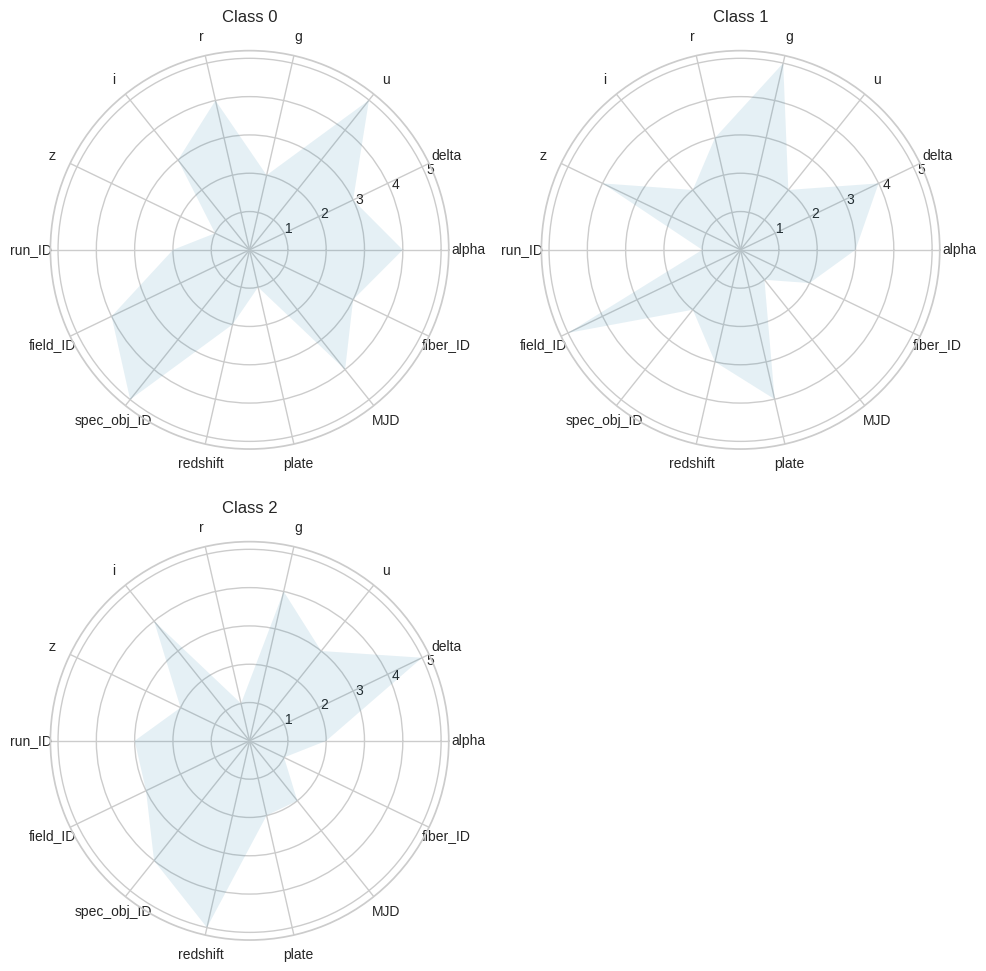

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

features = ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID', 'field_ID', 'spec_obj_ID', 'redshift', 'plate', 'MJD', 'fiber_ID']

class_names = ['Class 0', 'Class 1', 'Class 2']
categories = features
values_per_class = [
    [4, 3, 5, 2, 4, 3, 1, 2, 4, 5, 2, 1, 4, 3],  # Replace with values for Class 0
    [3, 4, 2, 5, 3, 2, 4, 1, 5, 2, 3, 4, 1, 2],  # Replace with values for Class 1
    [2, 5, 3, 4, 1, 4, 2, 3, 3, 4, 5, 2, 2, 1],  # Replace with values for Class 2
]
num_categories = len(categories)
angles = np.linspace(0, 2 * np.pi, num_categories, endpoint=False).tolist()
angles += angles[:1]
plt.figure(figsize=(10, 10))
for i, class_name in enumerate(class_names):
    ax = plt.subplot(2, 2, i + 1, polar=True)
    ax.fill(angles, values_per_class[i] + values_per_class[i][:1], 'b', alpha=0.1)
    plt.title(class_name)
    plt.xticks(angles[:-1], categories)
plt.tight_layout()
plt.show()


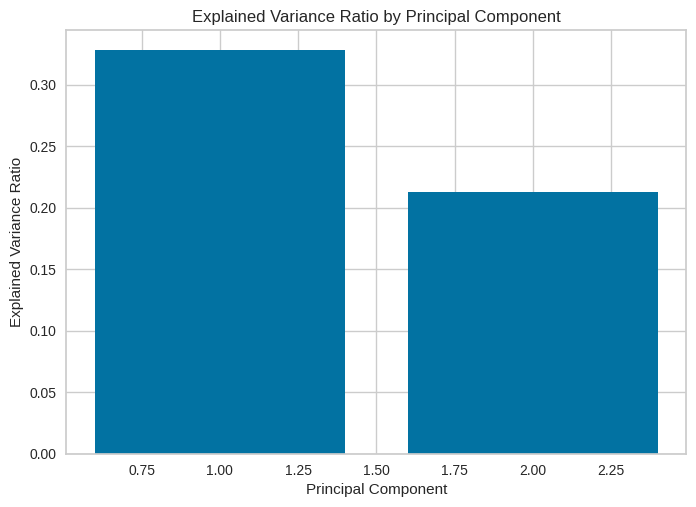

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

feature_columns = ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID', 'field_ID', 'spec_obj_ID', 'redshift', 'plate', 'MJD', 'fiber_ID']

X = df[feature_columns]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
n_components = 2
pca = PCA(n_components=n_components)
X_pca = pca.fit_transform(X_scaled)
pca_df = pd.DataFrame(data=X_pca, columns=[f'PC{i}' for i in range(1, n_components + 1)])
explained_variance = pca.explained_variance_ratio_
plt.bar(range(1, n_components + 1), explained_variance)
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance Ratio by Principal Component')
plt.show()


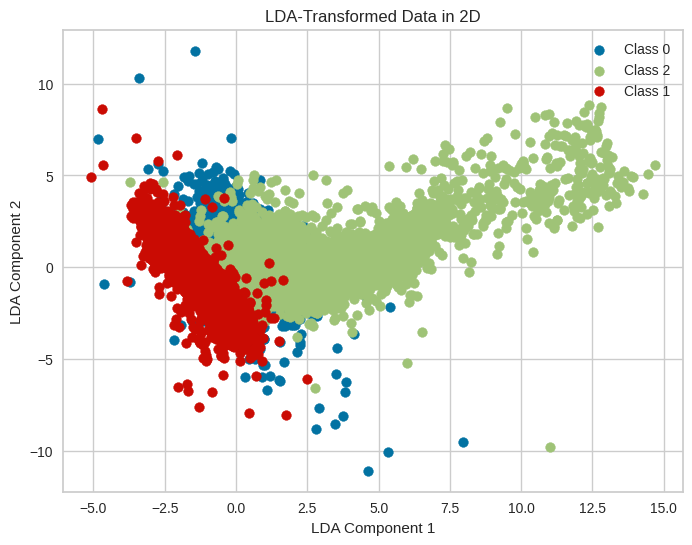

In [ ]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

lda = LinearDiscriminantAnalysis(n_components=2)
X_lda = lda.fit_transform(X, y)
plt.figure(figsize=(8, 6))
for class_label in df['class'].unique():
    plt.scatter(
        X_lda[y == class_label, 0],
        X_lda[y == class_label, 1],
        label=f'Class {class_label}'
    )

plt.xlabel('LDA Component 1')
plt.ylabel('LDA Component 2')
plt.legend()
plt.title('LDA-Transformed Data in 2D')

plt.show()


In [ ]:
x = df.drop('class', axis=1)
y = df['class']

In [ ]:
#KNN
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

features = ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID', 'field_ID', 'spec_obj_ID', 'redshift', 'plate', 'MJD', 'fiber_ID']
target = 'class'
X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = MinMaxScaler()

X_train_scaled = scaler.fit_transform(X_train)

X_test_scaled = scaler.transform(X_test)

knn = KNeighborsClassifier(n_neighbors=5)

knn.fit(X_train_scaled, y_train)

y_pred = knn.predict(X_test_scaled)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')


Accuracy: 0.87


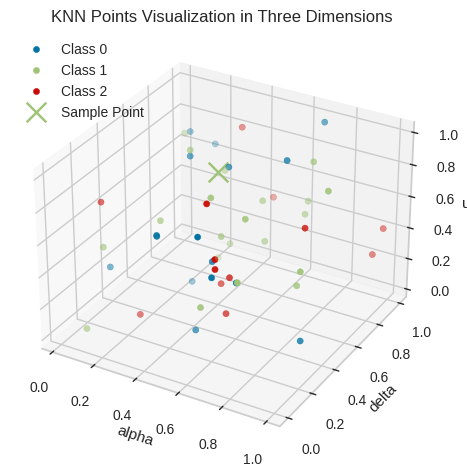

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

features = ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID', 'field_ID', 'spec_obj_ID', 'redshift', 'plate', 'MJD', 'fiber_ID']

np.random.seed(0)
X = np.random.rand(50, len(features))
y = np.random.choice([0, 1, 2], size=50)

sample_point = np.array([0.4, 0.6, 0.8])


dimension_x = 0
dimension_y = 1
dimension_z = 2

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

for class_label in [0, 1, 2]:
    ax.scatter(X[y == class_label, dimension_x], X[y == class_label, dimension_y], X[y == class_label, dimension_z], label=f'Class {class_label}')

ax.scatter(sample_point[dimension_x], sample_point[dimension_y], sample_point[dimension_z], c='g', marker='x', s=200, label='Sample Point')

ax.set_xlabel(features[dimension_x])
ax.set_ylabel(features[dimension_y])
ax.set_zlabel(features[dimension_z])
ax.legend()
ax.set_title('KNN Points Visualization in Three Dimensions')
plt.show()


In [ ]:
#SVM
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

features = ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID', 'field_ID', 'spec_obj_ID', 'redshift', 'plate', 'MJD', 'fiber_ID']
target = 'class'
X = df[features]
y = df[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


svm = SVC(kernel='linear')

svm.fit(X_train_scaled, y_train)

y_pred = svm.predict(X_test_scaled)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')


Accuracy: 0.94


In [ ]:
features = ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID', 'field_ID', 'spec_obj_ID', 'redshift', 'plate', 'MJD', 'fiber_ID']
target = 'class'
X = df[features]
y = df[target]


In [ ]:
from sklearn.metrics import classification_report
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = MinMaxScaler()

X_train_scaled = scaler.fit_transform(X_train)


In [ ]:
X_test_scaled = scaler.transform(X_test)

svm = SVC(kernel='linear')

svm.fit(X_train_scaled, y_train)

y_pred = svm.predict(X_test_scaled)

report = classification_report(y_test, y_pred, target_names=['Class 0', 'Class 1', 'Class 2'])

print(report)


              precision    recall  f1-score   support

     Class 0       0.95      0.96      0.95     11860
     Class 1       0.92      0.97      0.95      4343
     Class 2       0.96      0.86      0.90      3797

    accuracy                           0.94     20000
   macro avg       0.94      0.93      0.93     20000
weighted avg       0.94      0.94      0.94     20000



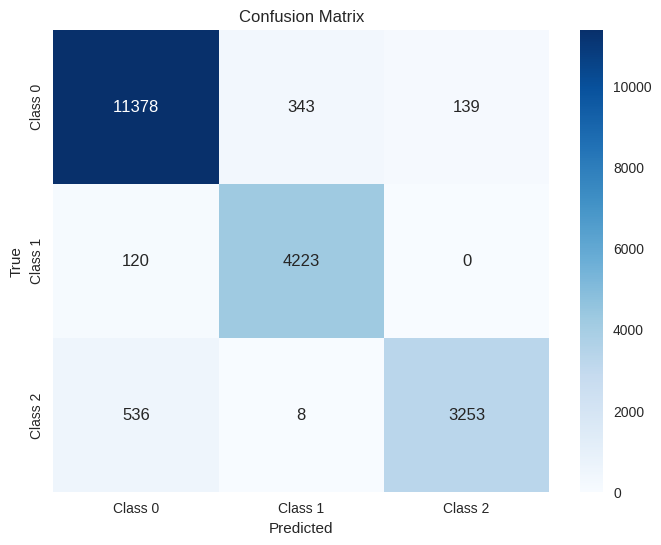

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)


plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Class 0', 'Class 1', 'Class 2'], yticklabels=['Class 0', 'Class 1', 'Class 2'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but SVC was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but SVC was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but SVC was fitted with feature names



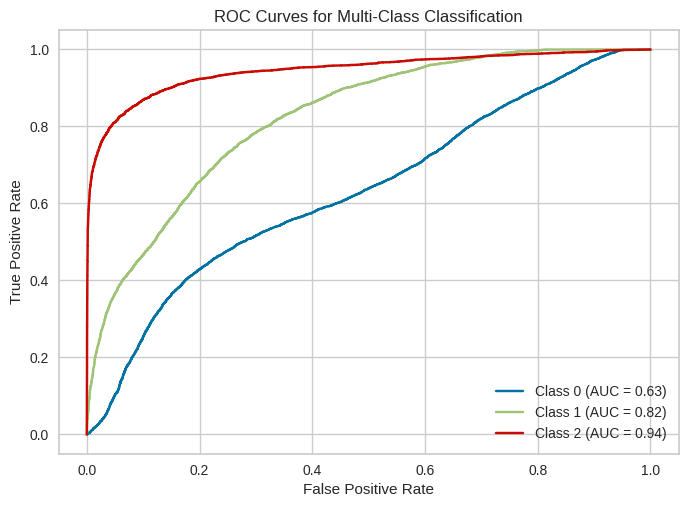

In [ ]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
import matplotlib.pyplot as plt
y_train_binarized = label_binarize(y_train, classes=[0, 1, 2])
y_test_binarized = label_binarize(y_test, classes=[0, 1, 2])

clf = OneVsRestClassifier(SVC())
clf.fit(X_train, y_train_binarized)
y_score = clf.decision_function(X_test_scaled)
fpr = {}
tpr = {}
roc_auc = {}
n_classes = y_train_binarized.shape[1]
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
plt.figure()
for i in range(n_classes):
      plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')  # Corrected f-string

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for Multi-Class Classification')
plt.legend(loc="best")
plt.show()


Accuracy with AdaBoost: 0.66


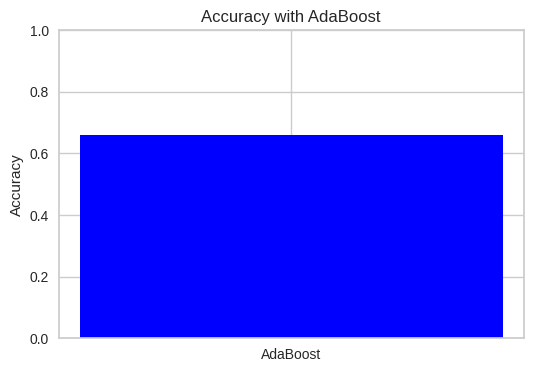

In [ ]:
import matplotlib.pyplot as plt
from sklearn.ensemble import AdaBoostClassifier

adaboost = AdaBoostClassifier(n_estimators=50, random_state=42)

adaboost.fit(X_train_scaled, y_train)


y_pred_adaboost = adaboost.predict(X_test_scaled)

accuracy_adaboost = accuracy_score(y_test, y_pred_adaboost)

print(f'Accuracy with AdaBoost: {accuracy_adaboost:.2f}')

plt.figure(figsize=(6, 4))
plt.bar(['AdaBoost'], [accuracy_adaboost], color='blue')
plt.ylabel('Accuracy')
plt.title('Accuracy with AdaBoost')
plt.ylim(0, 1.0)
plt.savefig('adaboost_accuracy.png')
plt.show()


In [ ]:
from sklearn.metrics import classification_report

class_names = ['Class 0', 'Class 1', 'Class 2']
report = classification_report(y_test, y_pred, target_names=class_names)
print(report)


              precision    recall  f1-score   support

     Class 0       0.95      0.96      0.95     11860
     Class 1       0.92      0.97      0.95      4343
     Class 2       0.96      0.86      0.90      3797

    accuracy                           0.94     20000
   macro avg       0.94      0.93      0.93     20000
weighted avg       0.94      0.94      0.94     20000



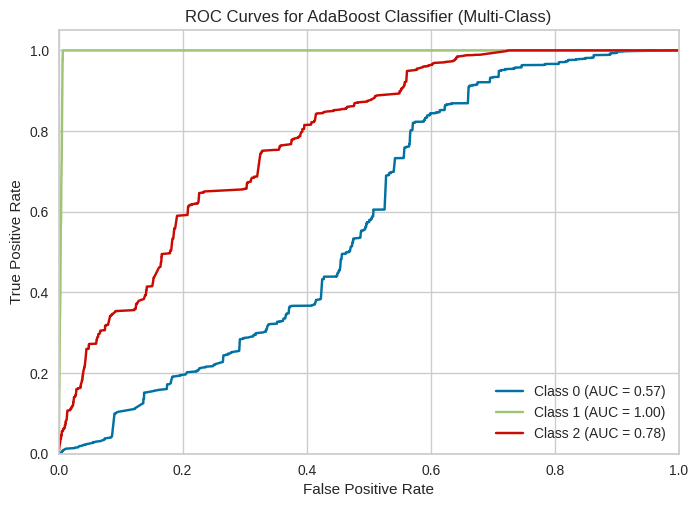

In [ ]:
import matplotlib.pyplot as plt
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

adaboost = AdaBoostClassifier(n_estimators=50, random_state=42)

adaboost.fit(X_train_scaled, y_train)

y_train_binarized = label_binarize(y_train, classes=[0, 1, 2])
y_test_binarized = label_binarize(y_test, classes=[0, 1, 2])

y_scores_adaboost = adaboost.decision_function(X_test_scaled)

fpr = {}
tpr = {}
roc_auc = {}
n_classes = y_train_binarized.shape[1]
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_scores_adaboost[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for AdaBoost Classifier (Multi-Class)')
plt.legend(loc="lower right")
plt.show()


In [ ]:
#decision Tree
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

features = ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID', 'field_ID', 'spec_obj_ID', 'redshift', 'plate', 'MJD', 'fiber_ID']
target = 'class'
X = df[features]
y = df[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
decision_tree = DecisionTreeClassifier(random_state=42)
decision_tree.fit(X_train, y_train)
y_pred = decision_tree.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')


Accuracy: 0.96


Accuracy: 0.96


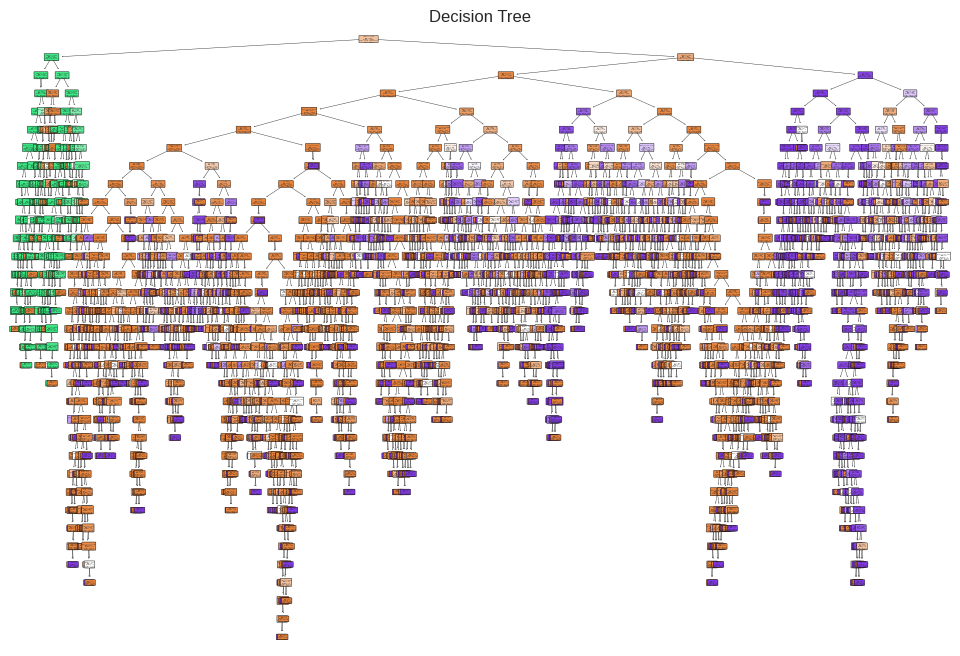

In [ ]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt

features = ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID', 'field_ID', 'spec_obj_ID', 'redshift', 'plate', 'MJD', 'fiber_ID']
target = 'class'
X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

decision_tree = DecisionTreeClassifier(random_state=42)
decision_tree.fit(X_train, y_train)
y_pred = decision_tree.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')
plt.figure(figsize=(12, 8))
plot_tree(decision_tree, feature_names=features, class_names=['Class 0', 'Class 1', 'Class 2'], filled=True, rounded=True)
plt.title('Decision Tree')
plt.show()


In [ ]:
from sklearn.metrics import classification_report
y_pred = decision_tree.predict(X_test)
class_names = ['Class 0', 'Class 1', 'Class 2']
report = classification_report(y_test, y_pred, target_names=class_names)
print(report)

              precision    recall  f1-score   support

     Class 0       0.97      0.97      0.97     11860
     Class 1       1.00      0.99      0.99      4343
     Class 2       0.91      0.91      0.91      3797

    accuracy                           0.96     20000
   macro avg       0.96      0.96      0.96     20000
weighted avg       0.96      0.96      0.96     20000



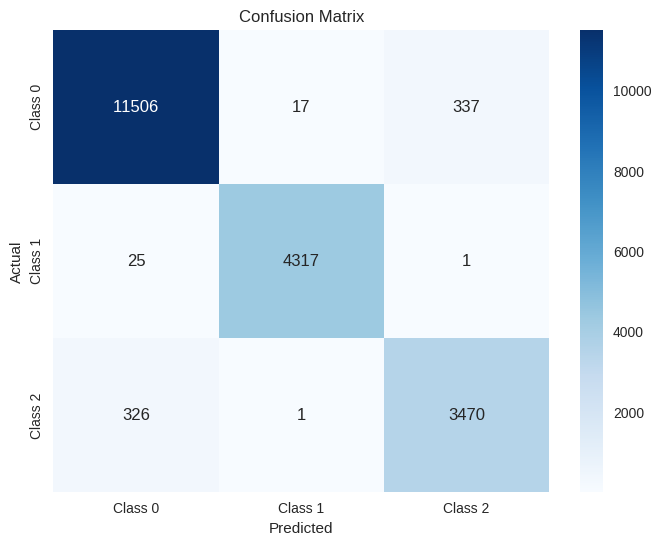

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


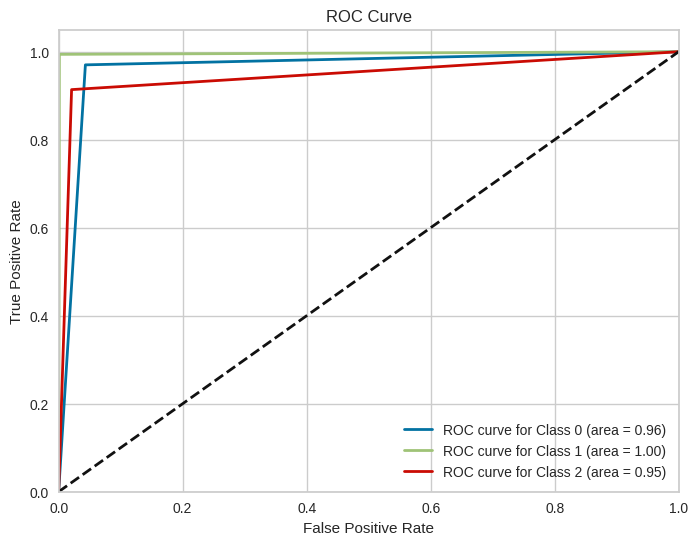

In [ ]:
from sklearn.metrics import roc_curve, auc

y_scores = decision_tree.predict_proba(X_test)
fpr = {}
tpr = {}
roc_auc = {}

for i in range(len(class_names)):
    fpr[i], tpr[i], _ = roc_curve(y_test, y_scores[:, i], pos_label=i)
    roc_auc[i] = auc(fpr[i], tpr[i])

plt.figure(figsize=(8, 6))
for i in range(len(class_names)):
    plt.plot(fpr[i], tpr[i], lw=2, label=f'ROC curve for {class_names[i]} (area = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()


In [ ]:
#RANDOM FOREST
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

features = ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID', 'field_ID', 'spec_obj_ID', 'redshift', 'plate', 'MJD', 'fiber_ID']
target = 'class'
X = df[features]
y = df[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
random_forest = RandomForestClassifier(n_estimators=100, random_state=42)

random_forest.fit(X_train_scaled, y_train)

y_pred = random_forest.predict(X_test_scaled)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')


Accuracy: 0.98


In [ ]:
from sklearn.metrics import classification_report

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

random_forest = RandomForestClassifier(n_estimators=100, random_state=42)

random_forest.fit(X_train_scaled, y_train)

y_pred = random_forest.predict(X_test_scaled)

class_names = y.unique().astype(str)
report = classification_report(y_test, y_pred, target_names=class_names)

print(report)


              precision    recall  f1-score   support

           0       0.98      0.98      0.98     11860
           2       0.98      1.00      0.99      4343
           1       0.97      0.93      0.95      3797

    accuracy                           0.98     20000
   macro avg       0.98      0.97      0.97     20000
weighted avg       0.98      0.98      0.98     20000



In [ ]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

features = ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID', 'field_ID', 'spec_obj_ID', 'redshift', 'plate', 'MJD', 'fiber_ID']
target = 'class'
X = df[features]
y = df[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

training_percentage = len(X_train) / len(X) * 100
testing_percentage = len(X_test) / len(X) * 100

print(f'Training Percentage: {training_percentage:.2f}%')
print(f'Testing Percentage: {testing_percentage:.2f}%')

Training Percentage: 80.00%
Testing Percentage: 20.00%


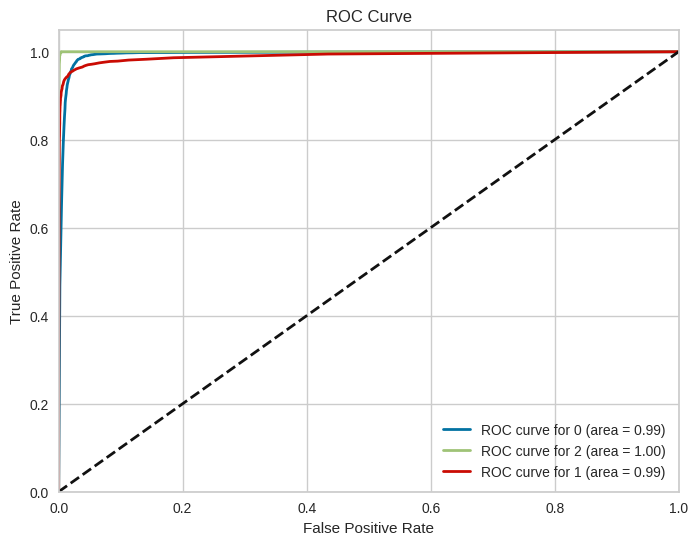

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
random_forest = RandomForestClassifier(n_estimators=100, random_state=42)

random_forest.fit(X_train_scaled, y_train)
y_scores = random_forest.predict_proba(X_test_scaled)
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(len(class_names)):
    fpr[i], tpr[i], _ = roc_curve(y_test, y_scores[:, i], pos_label=i)
    roc_auc[i] = auc(fpr[i], tpr[i])
plt.figure(figsize=(8, 6))
for i in range(len(class_names)):
    plt.plot(fpr[i], tpr[i], lw=2, label=f'ROC curve for {class_names[i]} (area = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()


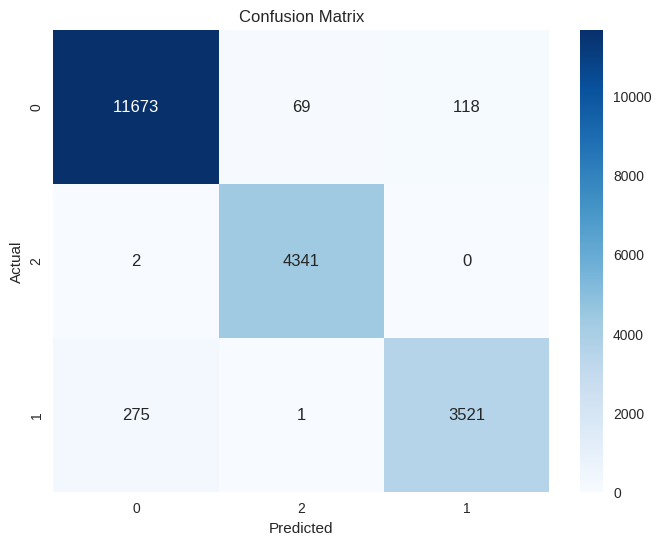

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
random_forest = RandomForestClassifier(n_estimators=100, random_state=42)

random_forest.fit(X_train_scaled, y_train)

y_pred = random_forest.predict(X_test_scaled)

conf_matrix = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


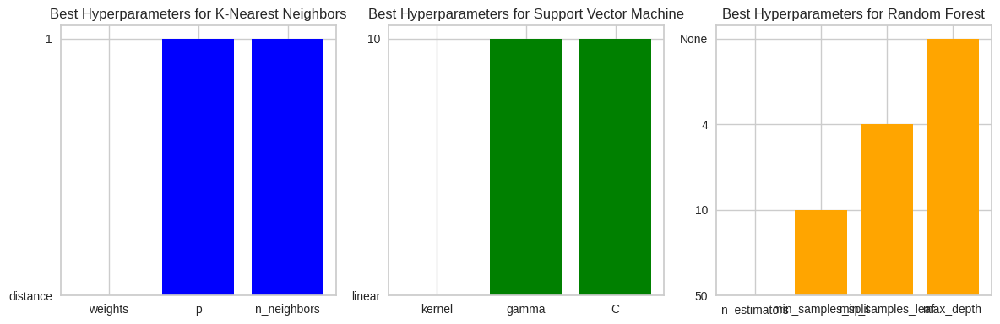

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import RandomizedSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

np.random.seed(0)
X = np.random.rand(50, len(features))
y = np.random.choice([0, 1, 2], size=50)

# K-Nearest Neighbors (KNN)
knn = KNeighborsClassifier()
param_dist_knn = {
    'n_neighbors': [1, 2, 3, 4, 5],
    'weights': ['uniform', 'distance'],
    'p': [1, 2],
}

random_search_knn = RandomizedSearchCV(knn, param_distributions=param_dist_knn, n_iter=10, cv=5, scoring='accuracy', random_state=0)
random_search_knn.fit(X, y)
best_params_knn = {str(key): str(value) for key, value in random_search_knn.best_params_.items()}

# Support Vector Machine (SVM)
svm = SVC()
param_dist_svm = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf', 'poly'],
    'gamma': [0.1, 1, 10],
}

random_search_svm = RandomizedSearchCV(svm, param_distributions=param_dist_svm, n_iter=10, cv=5, scoring='accuracy', random_state=0)
random_search_svm.fit(X, y)
best_params_svm = {str(key): str(value) for key, value in random_search_svm.best_params_.items()}

# Random Forest (RF)
rf = RandomForestClassifier()
param_dist_rf = {
    'n_estimators': [50, 100, 150],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
}

random_search_rf = RandomizedSearchCV(rf, param_distributions=param_dist_rf, n_iter=10, cv=5, scoring='accuracy', random_state=0)
random_search_rf.fit(X, y)
best_params_rf = {str(key): str(value) for key, value in random_search_rf.best_params_.items()}
plt.figure(figsize=(12, 4))

# K-Nearest Neighbors
plt.subplot(1, 3, 1)
plt.bar(best_params_knn.keys(), best_params_knn.values(), color='blue')
plt.title('Best Hyperparameters for K-Nearest Neighbors')

# Support Vector Machine
plt.subplot(1, 3, 2)
plt.bar(best_params_svm.keys(), best_params_svm.values(), color='green')
plt.title('Best Hyperparameters for Support Vector Machine')

# Random Forest
plt.subplot(1, 3, 3)
plt.bar(best_params_rf.keys(), best_params_rf.values(), color='orange')
plt.title('Best Hyperparameters for Random Forest')

plt.tight_layout()
plt.show()


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import joblib
features = ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID', 'field_ID', 'spec_obj_ID', 'redshift', 'plate', 'MJD', 'fiber_ID']
target = 'class'

X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

random_forest = RandomForestClassifier(n_estimators=100, random_state=42)
random_forest.fit(X_train, y_train)

y_pred = random_forest.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')

model_filename = 'random_forest_model.pkl'
joblib.dump(random_forest, model_filename)

print(f'Model saved to {model_filename}')


Accuracy: 0.98
Model saved to random_forest_model.pkl


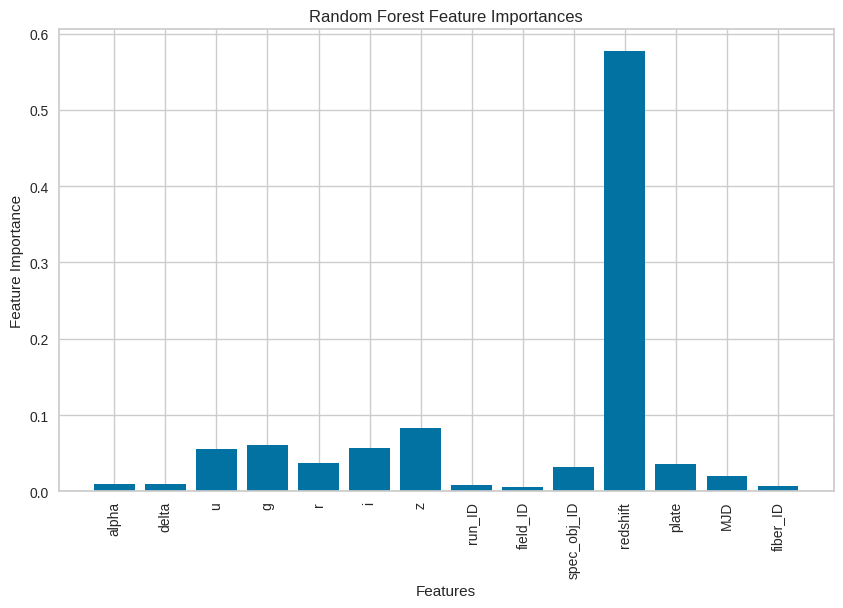

In [ ]:
import matplotlib.pyplot as plt

feature_importances = random_forest.feature_importances_

feature_names = features

plt.figure(figsize=(10, 6))
plt.bar(range(len(feature_importances)), feature_importances, tick_label=feature_names)
plt.xlabel('Features')
plt.ylabel('Feature Importance')
plt.title('Random Forest Feature Importances')
plt.xticks(rotation=90)
plt.show()


In [ ]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import joblib
features = ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID', 'field_ID', 'spec_obj_ID', 'redshift', 'plate', 'MJD', 'fiber_ID']
target = 'class'

X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

random_forest = RandomForestClassifier(n_estimators=100, random_state=42)
random_forest.fit(X_train, y_train)

y_pred = random_forest.predict(X_test)
print(y_pred)

[0 1 1 ... 0 0 0]


In [ ]:
import joblib
model_filename = 'random_forest_model.pkl'
loaded_model = joblib.load(model_filename)